**installing the requirements**

cd /path/to/your/project

pip3 install -r requirements.txt

In [3]:
import mesa
import seaborn as sns
import numpy as np
import pandas as pd
import heapq
import random

In [4]:
#LEGEND
#------#

#* to explain the code
#? commented out print statements for debugging
#! important things to note

#-----#

## *initiation of agents*

### Drone Agent

In [5]:

class DroneAgent(mesa.Agent):
    def __init__(self, model, unique_id=None, 
                 # these parameters are configurable
                 water_capacity=50, # Liters capactiy: can be changed based on the model 
                 water_threshold=50*0.35, # 35% of the capacity
                 energy_threshold=40,
                 max_energy=100,
                 emission_rate=0.05,
                 water_drop_rate=3.0,
                 water_start_amount=50, 
                 payload_capacity=16,
                 pathfinding_method = "a_star",
                 weight=52): #52 with battery and 39.9 without battery: DJI Agras T50
        if unique_id is None:
            unique_id = id(self)
        super().__init__(unique_id, model)

        #* basic properties
        self.location = None
        self.goal = None
        self.path = []
        self.arrived = False
        self.typ = "drone"
        
        #* targetting parameters
        self.current_target = None
        self.target_type = None
        
        #* weight / payload parameters
        self.weight = weight
        self.payload = 0
        self.payload_capacity = payload_capacity
        self.total_weight = self.weight + self.payload

        #* parameters related to the water properties
        self.water_capacity = water_capacity
        self.water = water_start_amount
        self.water_threshold = water_threshold
        self.water_used = 0
        self.water_drop_rate = water_drop_rate
        
        #* firefighting parameters
        self.fires = []
        self.firefighting = False
        self.target_fire = None
        self.water_stations = []
        self.time_at_fire = 0
        self.max_time_at_fire = 5

        #* energy parameters
        self.energy = max_energy
        self.recharging = False
        self.energy_threshold = energy_threshold
        self.refilling_water = False
        self.energy_stations = []
        self.max_energy = max_energy
            
        #* cost and emisison parameters which will be used for the analysis later
        self.emision_rate = emission_rate
        self.total_emission = 0.0 #total accumulated emissions
        self.operational_cost_per_step = 0.02 #fixed cost per step
        self.energy_cost_per_unit = 0.05 # cost per unit of energy
        self.recharge_emissions = 0.0 #emissions from recharging are tracked here
        self.recharge_cost_per_unit = 0.0 #recharge cost per unit of energy
        self.total_cost = 0.0 # total accumulated cost
        self.water_emissions = 0.0 #emissions from water usage
        self.last_step_emissions = 0.0 
        
        #* pathfinding configuration
        self.pathfinding_method = pathfinding_method # ["a_star", "ant_colony", "ABC"]
        self.pathfinding_handlers = {
            "a_star": self.a_star_search,
            "ACO": self.ant_colony_search,
            "ABC": self.abc_search
        }
        
        #* High risk areas
        self.high_risk_area = None
        self.monitoring_high_risk = False 
    
    
        #* Ant Colony Optimization parameters
        self.pheromone_matrix = {}  # Will be initialized on first use
        self.pheromone_evaporation = 0.5  # Rate at which pheromones evaporate
        self.pheromone_importance = 1.0  # Alpha parameter - importance of pheromone
        self.heuristic_importance = 2.0  # Beta parameter - importance of distance heuristic
        self.num_ants = 60  # Number of ants to use in the algorithm #! increasing makes the model perform way better
        self.initial_pheromone = 0.1 
        
        #* ABC artificial bee colony parameters
        self.abc_colony_size = 50  # Number of bees
        self.abc_iterations = 30  # Number of iterations
        self.abc_limit = 15       # Limit before abandoning a solution
        self.abc_best_path = None  # Track best path found
        self.abc_solution_memory = {}  # Cache for recently found paths
                

        #* mode handling for quicker runtime and less complexity
        self.current_mode = None
        self.mode_handlers = {
            "charging_energy": self.handle_charging_energy,
            "charging_water": self.handle_charging_water,
            "firefighting": self.handle_firefighting,
            "searching_energy": self.handle_searching_energy,
            "searching_water": self.handle_searching_water,
            "searching_fire": self.handle_searching_fire,
            "monitoring_high_risk_area": self.handle_monitor_high_risk_area
        }
        
        
    def step(self):
        if self.energy <= 0:
            return
        
        self.update_energy_consumption()
        
        mode = self.determine_mode()
        self.mode = mode
        
        #! Handle each mode
        
        #* for debugging purposes
        #? print(f"Drone {self.unique_id} at {self.location}: Energy={self.energy}/{self.max_energy}, "
        #?      f"Water={self.water}/{self.water_capacity}, Mode={mode}")
         
        if mode in self.mode_handlers:
            self.mode_handlers[mode]()
         
        else:
            #? print(f"Unknown mode: {mode}. Skipping step.")
            return
    
    #* decision making method (determine mode)
    
    def determine_mode(self):        
        
        #* mode is determined based on the current state of the drone
        
        for station in self.energy_stations:
            if station.location == self.location:
                return "charging_energy"
        
        for station in self.water_stations:
            if station.location == self.location:
                return "charging_water"
        
        if self.monitoring_high_risk and self.high_risk_area and self.energy > self.energy_threshold * 1.2 and self.water > self.water_threshold * 1.2:
            return "monitoring_high_risk"
            
        if hasattr(self.model, 'active_fires'):
            for fire in self.model.active_fires:
                if fire.location == self.location and fire.active:
                    return "firefighting"
        
        if self.energy <= self.energy_threshold:
            return "searching_energy"
        
        # Check water level
        if self.water <= self.water_threshold:
            return "searching_water"
        
        
        return "searching_fire"
    
    #* handeler methods for each mode
    
    def handle_charging_energy(self):
        for station in self.energy_stations:
            if station.location == self.location:

                    #* calculate energy needed
                    energy_needed = self.max_energy - self.energy
                    
                    if energy_needed > 0:
                        
                        #* get energy from station
                        charge_data = station.provide_charge(energy_needed)
                        actual_energy = charge_data["energy"]
                        
                        self.energy += actual_energy
                        
                        #* update tracking metrics
                        self.recharge_emissions += charge_data["emissions"]
                        self.recharge_cost_per_unit += charge_data["cost"]
                        self.total_emission += charge_data["emissions"] 
                        self.total_cost += charge_data["cost"]
                        
                        #? print(f"Recharged from {old_energy} to {self.energy}")
                    
                    #* clear path and target since we finished refilling
                    self.path = []
                    self.target_fire = None
                    self.current_target = None
                    self.target_type = None
                    
                    possible_moves = self.model.grid.get_neighborhood(
                        self.location, moore=True, include_center=False
                    )
                
                    if possible_moves:
                        #* choose a random neighbor and move there (to avoid getting stuck)
                        new_pos = self.random.choice(possible_moves)
                        self.model.grid.move_agent(self, new_pos)
                        self.location = new_pos
                        self.energy -= 1
                        #? print(f"Drone {self.unique_id}: Moved from station to {new_pos}")
                    
                    break
        
    def handle_charging_water(self):
        for station in self.water_stations:
            if station.location == self.location:

                #* calculate water needed
                water_needed = self.water_capacity - self.water
                
                if water_needed > 0:
                    #* get water from station
                    water_data = station.provide_water(water_needed)
                    actual_water = water_data["water"]
                    

                    self.water += actual_water
                    self.payload = self.water
                    self.total_weight = self.weight + self.payload
                    
                    #* update tracking metrics
                    self.water_emissions += water_data["emissions"]
                    self.total_emission += water_data["emissions"]
                    self.total_cost += water_data["cost"]
                    
                    #? print(f"Refilled water from {old_water} to {self.water}")
                
                #* clear path and target since we finished refilling
                self.path = []
                self.target_fire = None
                self.current_target = None
                self.target_type = None
                
                possible_moves = self.model.grid.get_neighborhood(
                    self.location, moore=True, include_center=False
                )
                
                if possible_moves:
                    #* choose a random neighbor and move there (to avoid getting stuck)
                    new_pos = self.random.choice(possible_moves)
                    self.model.grid.move_agent(self, new_pos)
                    self.location = new_pos
                    self.energy -= 1
                    #? print(f"Drone {self.unique_id}: Moved from station to {new_pos}")
                
                break
                
    def handle_firefighting(self):

        #* firefighting mode
        
        for fire in self.model.active_fires:
            if fire.location == self.location and fire.active:
                if self.water > self.water_threshold:
                    #* use water to fight fire
                    water_used = min(10, self.water)
                    self.water -= water_used
                    self.payload = self.water
                    self.total_weight = self.weight + self.payload
                    self.water_used += water_used
                    
                    #? print(f"Using {water_used} water on fire at {fire.location}")
                    
                    #* apply water to fire
                    fire.apply_water(water_used)
                    
                    #* update tracking metrics (emissions and cost)
                    emissions = water_used * fire.water_applied
                    self.total_emission += emissions
                    
                    #* update energy 
                    self.energy -= 1

                    
                    #* track time at fire to avoid getting stuck
                    self.time_at_fire += 1
                    if fire.intensity <= 0.5:
                        fire.extinguish()
                        self.mode = "searching_fire"

                else:
                    self.current_mode = "searching_water"
                    return
                    
                break
    
    def handle_searching_energy(self):
        #* handle searching for closest energy station

        #* if already on path to energy station: continue
        if self.path and self.target_type == "energy":
            self.move_along_path()
            return
        
        #* find closest energy station
        target = self.find_nearest_target("energy")
        if target:
            #? print(f"Found recharge station at {target.location}")
            self.path = self.calculate_path(self.location, target.location)
            self.current_target = target
            self.target_type = "energy"
            
            if self.path:
                self.move_along_path()
        else:
            print(f"No energy stations available!")
    
    def handle_monitor_high_risk_area(self):
    
        #* handle monitoring high-risk area
    
        if not self.high_risk_area:
            self.monitoring_high_risk = False
            return
        
        #* if already on path to high-risk area: continue
        if self.path and self.target_type == "high_risk":
            self.move_along_path()
            return
            
        #* if  already at the high-risk area
        if self.location == self.high_risk_area:
            #* patrol around high risk areas
            neighbors = self.model.grid.get_neighborhood(
                self.location, moore=True, include_center=False
            )
            if neighbors:
                #* pick a random neighbouring cell
                new_pos = self.random.choice(neighbors)
                self.model.grid.move_agent(self, new_pos)
                self.location = new_pos
                self.energy -= 0.5  #* lower energy cost for patrolling
                
                #* check for fires in the area
                for fire in self.model.active_fires:
                    if fire.active and self.manhattan_distance(self.location, fire.location) <= 3:

                        #* if fire is detected, switch to firefighting mode
                        
                        self.monitoring_high_risk = False
                        self.high_risk_area = None
                        self.target_fire = fire
                        self.path = self.calculate_path(self.location, fire.location)
                        self.current_target = fire
                        self.target_type = "fire"
                        print(f"Drone {self.unique_id} detected fire at {fire.location} while monitoring high-risk area!")
                        return
        else:
            #* find closest high-risk area and calculate path
            self.path = self.calculate_path(self.location, self.high_risk_area)
            self.current_target = self.high_risk_area
            self.target_type = "high_risk"
            
            if self.path:
                self.move_along_path()
    
    def predict_fire_spread(self,fire):
        #* predict fire spread based on current fire intensity and location
        if not fire.active:
            return []
        
        potential_spread_locations = []
        neighbors = self.model.grid.get_neighborhood(fire.location, moore=True, include_center=False)
        
        for neighbor in neighbors:
            #* check if cell already has fire
            cell_contents = self.model.grid.get_cell_list_contents(neighbor)
            fire_in_cell = any(isinstance(agent, FireArea) for agent in cell_contents)
            
            if not fire_in_cell:
                #* calculate spread probability based on fire intensity
                spread_probability = fire.intensity * 0.1
                
                #* potential spread locations
                potential_spread_locations.append((neighbor, spread_probability))
        
        # Sort by probability (highest first)
        potential_spread_locations.sort(key=lambda x: x[1], reverse=True)
        
        return [loc for loc, prob in potential_spread_locations[:3]] 
                 
    def handle_searching_water(self):

        #* handle searching for closest water station
        
        #* check if alread on path to water station
        if self.path and self.target_type == "water":
            self.move_along_path()
            return
        
        #* find closest water station
        target = self.find_nearest_target("water")
        if target:
            print(f"Found water station at {target.location}")
            self.path = self.calculate_path(self.location, target.location)
            self.current_target = target
            self.target_type = "water"
            
            if self.path:
                self.move_along_path()
        else:
            print(f"No water stations available!")
        
    def handle_searching_fire(self):

        #* handle searching for closest fire
        
        if self.path and self.target_type == "fire":
            if hasattr(self.target_fire, "active") and not self.target_fire.active:
                #* fire is no longer active
                #?print(f"Target fire is no longer active")
                self.path = []
                self.target_fire = None
                self.current_target = None
                self.target_type = None
            else:
                self.move_along_path()
                return     

        #* find closest fire
        target = self.find_nearest_target("fire")
        
        if target:
            #?print(f"Found fire at {target.location}")
            self.path = self.calculate_path(self.location, target.location)
            self.target_fire = target
            self.current_target = target
            self.target_type = "fire"
            

            if self.path:
                self.move_along_path()
        else:
            print(f"No fires available!")
            
    def random_move(self):
        #* random move used for debugging and testing and random patrol when all fires extinguished (now it just stopps)
        possible_moves = self.model.grid.get_neighborhood(
            self.location, moore=True, include_center=False
        )
        
        if possible_moves:
            new_pos = self.random.choice(possible_moves)
            self.model.grid.move_agent(self, new_pos)
            self.location = new_pos
            self.energy -= 1
            
            print(f"Drone {self.unique_id}: Moved randomly to {new_pos}")
        else:
            print(f"Drone {self.unique_id}: No possible moves!")
        
    #* path finding methods
    
    def find_nearest_target(self, target_type):
        
        #* find the nearest target of the specified type (fire, water, energy) 
        # uses manhattan distance
        
        if target_type == "fire":
            #* find closest fire
            if not hasattr(self.model, 'active_fires') or not self.model.active_fires:
                return None
            
            #* prioritize active fires witth closer distance and higher intensity
            prioritized_fires = []
            for fire in self.model.active_fires:
                if not fire.active:
                    continue
                dist = self.manhattan_distance(self.location, fire.location)
                priority_score = dist / (fire.intensity + 0.5)
                prioritized_fires.append((priority_score, fire))
            
            if prioritized_fires:
                prioritized_fires.sort(key=lambda x: x[0])
                closest_fire = prioritized_fires[0][1]
                return closest_fire
            return None
            
        elif target_type == "water":
            #* find closest water station
            if not self.water_stations:
                return None
                
            closest = None
            min_dist = float('inf')
            
            for station in self.water_stations:
                dist = self.manhattan_distance(self.location, station.location)
                if dist < min_dist:
                    min_dist = dist
                    closest = station
                    
            return closest
            
        elif target_type == "energy":
            #* find closest energy station
            if not self.energy_stations:
                return None
                
            closest = None
            min_dist = float('inf')
            
            for station in self.energy_stations:
                dist = self.manhattan_distance(self.location, station.location)
                if dist < min_dist:
                    min_dist = dist
                    closest = station
                    
            return closest
            
        return None  #* no target found

    def calculate_path(self, start, goal):
        if start == goal:
            return []
        
        if self.pathfinding_method in self.pathfinding_handlers:
            return self.pathfinding_handlers[self.pathfinding_method](start, goal)
        else:
            #* if somehow pathfinding method is not recognized, or fails, use A* as default as it always works
            print(f"Pathfinding method {self.pathfinding_method} not recognized. Using A* as default.")
            return self.a_star_search(start, goal)
    
    def move_along_path(self):
        if not self.path:
            return

        #*  removes the first position from the path and moves to that position
        next_pos = self.path.pop(0)
        
        #* moves agent to next position
        self.model.grid.move_agent(self, next_pos)
        self.location = next_pos
        
        self.update_total_weight()
        
        #* calculate emissions  based on the current weight and payload
        payload_factor = self.payload / self.payload_capacity if self.payload_capacity > 0 else 0
        weight_emission_factor = 1 + ( payload_factor * 0.3)  #! 30% more emissions at full payload
                
        #* update energy consumption based on weight and payload
        movement_emissions = self.emision_rate * weight_emission_factor
        self.total_emission += movement_emissions
        
        energy_cost = self.energy_cost_per_unit
        operational_cost = self.operational_cost_per_step * (1 + 0.2 * payload_factor)  # 20% more cost at full payload
        movement_cost = energy_cost + operational_cost
        self.total_cost += movement_cost
        
        self.energy -= 1

    
    #* Pathfinding algorithms:
    
    #* A* Search Algorithm:
    def a_star_search(self, start, goal):
        #* implementation of A* search algorithm: assuming a grid-based model and taken from heapq 
        
        """
        Python Software Foundation. (2025). heapq - Heap queue algorithm. Python 3.13.3 documentation. Retrieved from https://docs.python.org/3/library/heapq.html
        """
        
        frontier = [(0, start, [])]  #* (cost, position, path)
        visited = set()
        
        while frontier:
            cost, current, path = heapq.heappop(frontier)
            
            if current == goal:
                return path
                
            if current in visited:
                continue
                
            visited.add(current)
            
            # Get neighbors
            neighbors = self.model.grid.get_neighborhood(
                current, moore=True, include_center=False
            )
            
            for next_pos in neighbors:
                if next_pos not in visited:
                    new_path = path + [next_pos]
                    priority = len(new_path) + self.manhattan_distance(next_pos, goal)
                    heapq.heappush(frontier, (priority, next_pos, new_path))
        
        return [goal]
    
    #* Ant Colony Optimization:
    def ant_colony_search(self, start, goal):

        #? print(f"Using Ant Colony Optimization to find path from {start} to {goal}")
        
        #* Initialize pheromone matrix if not already done
        if not self.pheromone_matrix:
            self._initialize_pheromones()
        
        #* parameters
        iterations = 5  #* number of complete iterations (generations of ants)
        best_path = None
        best_path_length = float('inf')
        
        for iteration in range(iterations):
            #* each iteration sends out all ants
            ant_paths = []
            ant_path_lengths = []
            
            for ant in range(self.num_ants):
                #* each ant finds a path
                path = self._find_ant_path(start, goal)
                if path:
                    path_length = len(path)
                    ant_paths.append(path)
                    ant_path_lengths.append(path_length)
                    
                    #* update best path if this is better
                    if path_length < best_path_length:
                        best_path = path
                        best_path_length = path_length
            
            #* üpdate pheromones based on ant paths
            self._update_pheromones(ant_paths, ant_path_lengths)
        
        #* retunr path if found
        if best_path:
            return best_path
        else:
            #* fall back to A* if no path found
            #? print("Ant Colony Optimization failed to find path, falling back to A*")
            return self.a_star_search(start, goal)

    def _initialize_pheromones(self):
        #* initialize pheromone matrix with default values
        self.pheromone_matrix = {}
        
        #* pheromone matrix can also be initialized from previous runs to potentially improve performance over generations
        

    def _find_ant_path(self, start, goal):
        
        #* a single ant finds a path from start to goal using pheromone levels and heuristic
        
        current = start
        path = []  #*  starting position in path (to match A* structure) is not included 
        visited = set([start])
        
        #* max number of steps to avoid infinite loops
        max_steps = 1000
        steps_taken = 0
        
        while current != goal and steps_taken < max_steps:
            steps_taken += 1
            
            #* get valid next positions (neighbors that are not yet visited)
            neighbors = self.model.grid.get_neighborhood(
                current, moore=True, include_center=False
            )
            valid_neighbors = [n for n in neighbors if n not in visited]
            
            if not valid_neighbors:
                #* no valid neighbors: this ant is stuck
                return None
                
            #* calculate probabilities for each neighbor based on pheromone and distance
            probabilities = []
            for neighbor in valid_neighbors:
                #* get pheromone level (or default if not set)
                edge = tuple(sorted([current, neighbor]))
                pheromone = self.pheromone_matrix.get(edge, self.initial_pheromone)
                
                #* Calculate heuristic (inverse of distance to goal)
                distance = self.manhattan_distance(neighbor, goal)
                if distance == 0:
                    heuristic = 1000  #* high value if goal reached
                else:
                    heuristic = 1.0 / distance
                    
                #* calculate probability value (not normailized yet)
                probability = (pheromone ** self.pheromone_importance) * (heuristic ** self.heuristic_importance)
                probabilities.append(probability)
                
            #* normalize probabilities
            total = sum(probabilities)
            if total == 0:
                next_pos = random.choice(valid_neighbors)
            else:
                normalized_probs = [p/total for p in probabilities]
                
                #* choose next position based on probabilities
                next_pos = random.choices(valid_neighbors, weights=normalized_probs, k=1)[0]
            
            #* move to next position
            path.append(next_pos)
            visited.add(next_pos)
            current = next_pos
            
            #* check if goal is reached
            if current == goal:
                break
        
        if steps_taken >= max_steps:
            return None
                
        return path

    def _update_pheromones(self, ant_paths, path_lengths):
        
        #* update pheromone levels based on ant paths
        #* ant paths: list of paths (each path is a list of positions)
        #* path lengths: list of path lengths
        
        #* first, apply evaporation to all edges
        for edge in self.pheromone_matrix:
            self.pheromone_matrix[edge] *= (1 - self.pheromone_evaporation)
        
        #* add new pheromones from ant 
        for path, length in zip(ant_paths, path_lengths):
            #* pheromone amount is inversely proportional to path length
            pheromone_amount = 1.0 / length
            
            #* for each edge in the path
            for i in range(len(path) - 1):
                pos1 = path[i]
                pos2 = path[i + 1]
                edge = tuple(sorted([pos1, pos2]))
                
                #* add pheromone to the edge
                if edge in self.pheromone_matrix:
                    self.pheromone_matrix[edge] += pheromone_amount
                else:
                    self.pheromone_matrix[edge] = self.initial_pheromone + pheromone_amount
    
    #* Artificial Bee Colony Optimization:
    def abc_search(self, start, goal):
        
        #* find path using Artificial Bee Colony Optimization (ABC)
        #* returns: list(positions) representing the path
        
        #? print(f"Using Artificial Bee Colony Optimization to find path from {start} to {goal}")
        
        #* check cache for recently found paths to this goal
        path_key = (start, goal)
        if path_key in self.abc_solution_memory:
            return self.abc_solution_memory[path_key].copy()
        
        #* initialize bee colony
        employed_bees = []
        onlooker_bees = []
        
        #* initialize food sources (potential solutions)
        #*eEach food source is a potential path
        food_sources = []
        abandonment_counters = []
        
        #* create initial food sources (paths) using greedy random initialization
        for _ in range(self.abc_colony_size):
            path = self._generate_initial_path(start, goal)
            if path:
                food_sources.append(path)
                abandonment_counters.append(0)
        
        if not food_sources:
            print("ABC could not generate initial paths, falling back to A*")
            return self.a_star_search(start, goal)
        

        best_path = None
        best_fitness = float('inf')
        
        #*  ABC algorithm loop
        for iteration in range(self.abc_iterations):
            #* 
            for i in range(len(food_sources)):
                #* generate neighbor solution (path) for each employed bee
                neighbor_path = self._generate_neighbor_path(food_sources[i], start, goal)
                
                #* calculate fitness of current and neighbor paths
                current_fitness = self._calculate_path_fitness(food_sources[i], goal)
                neighbor_fitness = self._calculate_path_fitness(neighbor_path, goal)
                
                #* greedy selection: if neighbor is better, replace current path
                if neighbor_fitness < current_fitness:
                    food_sources[i] = neighbor_path
                    abandonment_counters[i] = 0
                else:
                    abandonment_counters[i] += 1
            
            #* calculate probabilities for onlooker bees
            fitnesses = [self._calculate_path_fitness(path, goal) for path in food_sources]
            max_fitness = max(fitnesses) if fitnesses else 1
            
            if max_fitness == 0:
                probabilities = [1 / len(fitnesses) for _ in fitnesses]  # Assign equal probabilities
            else:
                probabilities = [1 - (fit / max_fitness) for fit in fitnesses]
            #* invert and normalize fitnesses (lower is better for path lengths)
            sum_prob = sum(probabilities) if sum(probabilities) > 0 else 1
            probabilities = [p/sum_prob for p in probabilities]
            
            #* onlooker Bee phase
            for _ in range(len(food_sources)):
                #* select food source based on probability
                selected_idx = self._select_by_probability(probabilities)
                if selected_idx is None:
                    continue
                    
                #* Generate neighbor and apply greedy selection like employed bees
                neighbor_path = self._generate_neighbor_path(food_sources[selected_idx], start, goal)
                
                current_fitness = self._calculate_path_fitness(food_sources[selected_idx], goal)
                neighbor_fitness = self._calculate_path_fitness(neighbor_path, goal)
                
                if neighbor_fitness < current_fitness:
                    food_sources[selected_idx] = neighbor_path
                    abandonment_counters[selected_idx] = 0
                else:
                    abandonment_counters[selected_idx] += 1
            
            #* scout Bee phase
            for i in range(len(food_sources)):
                if abandonment_counters[i] >= self.abc_limit:
                    #* abondon and generate new solution
                    food_sources[i] = self._generate_initial_path(start, goal)
                    abandonment_counters[i] = 0
            
            #* update best solution so far
            for path in food_sources:
                fitness = self._calculate_path_fitness(path, goal)
                if fitness < best_fitness:
                    best_fitness = fitness
                    best_path = path.copy()
        
        #* if we found a path cache and return it
        if best_path:
            self.abc_best_path = best_path
            # Store in memory cache
            self.abc_solution_memory[path_key] = best_path.copy()
            # Limit cache size to avoid memory issues
            if len(self.abc_solution_memory) > 50:
                self.abc_solution_memory.pop(next(iter(self.abc_solution_memory)))
            return best_path
        else:
            #* if ABC fails fall back to A*
            #? print("Artificial Bee Colony failed to find path, falling back to A*")
            return self.a_star_search(start, goal)
    
    def _generate_initial_path(self, start, goal):
        path = []
        current = start
        visited = set([start])
        
        #* max steps to avoid infinite loops
        max_steps = 100
        steps = 0
        
        while current != goal and steps < max_steps:
            neighbors = self.model.grid.get_neighborhood(
                current, moore=True, include_center=False
            )
            
            #* filter out already visited positions
            valid_neighbors = [n for n in neighbors if n not in visited]
            
            if not valid_neighbors:
                #* no valid neighbors: this path is stuck
                return None
            
            #* calculate weights for each neighbor based on distance to goal
            neighbor_weights = []
            for neighbor in valid_neighbors:
                #* calculate distance to goal
                dist = self.manhattan_distance(neighbor, goal)
                #* Lower distance = higher weight
                weight = 1.0 / (dist + 0.1)
                #* add some randomness
                weight *= (0.8 + 0.4 * random.random())
                neighbor_weights.append(weight)
            
            #* choose next position using weights
            next_pos = random.choices(valid_neighbors, weights=neighbor_weights, k=1)[0]
            path.append(next_pos)
            visited.add(next_pos)
            current = next_pos
            steps += 1
            
            if current == goal:
                return path
        
        return path if path else None

    def _generate_neighbor_path(self, path, start, goal):

        #* generate a neighbor path 
        
        if not path:
            return self._generate_initial_path(start, goal)
        
        #* copy path avoid modifying  original
        new_path = path.copy()
        
        #* choose mutation strategy
        mutation_type = random.choice(["remove", "insert", "swap"])
        
        if mutation_type == "remove" and len(new_path) > 2:
            
            idx = random.randint(0, len(new_path) - 1)
            new_path.pop(idx)
            
        elif mutation_type == "insert":
            #* insert a new position into the path
            if len(new_path) > 0:
                idx = random.randint(0, len(new_path))
                
                #* choose what to insert
                if idx == 0:
                    current = start
                else:
                    current = new_path[idx - 1]
                    
                if idx == len(new_path):
                    target = goal
                else:
                    target = new_path[idx]
                    
                #* get valid pos to insert
                neighbors = self.model.grid.get_neighborhood(
                    current, moore=True, include_center=False
                )
                
                if neighbors:
                    valid_inserts = []
                    for neighbor in neighbors:
                        if neighbor != target:
                            valid_inserts.append(neighbor)
                    
                    if valid_inserts:
                        insert_pos = random.choice(valid_inserts)
                        new_path.insert(idx, insert_pos)
                
        elif mutation_type == "swap" and len(new_path) > 1:
            idx1 = random.randint(0, len(new_path) - 2)
            idx2 = idx1 + 1
            new_path[idx1], new_path[idx2] = new_path[idx2], new_path[idx1]
        
        return new_path

    def _calculate_path_fitness(self, path, goal):
        
        #* calculate fitness of a path
        
        if not path:
            return float('inf')
        
        #* account for path length
        fitness = len(path)
        
        #* check if path reaches goal
        if path and path[-1] == goal:
            fitness -= 10  #* big reward for reaching goal
        else:
            #* penalty for not reaching goal
            last_point = path[-1] if path else None
            if last_point:
                distance_to_goal = self.manhattan_distance(last_point, goal)
                fitness += distance_to_goal * 2  #* higher penalty for being far from goal
        
        return fitness

    def _select_by_probability(self, probabilities):
        #* select an index based on the given probabilities
        try:
            return random.choices(range(len(probabilities)), weights=probabilities, k=1)[0]
        except:
            #* handle case where probabilities are empty
            return None if not probabilities else random.randint(0, len(probabilities)-1)  
   
    #* Utility methods: 
    
    def update_total_weight(self):
        #* update total weight based on payload
        water_weight = self.water * 0.001 
        self.payload = water_weight
        self.total_weight = self.weight + self.payload
    
    def update_energy_consumption(self):
        #* consumption when empty
        base_consumption = 0.5
        
        payload_factor = self.payload / self.payload_capacity if self.payload_capacity > 0 else 0
        
        consumption_rate = base_consumption * (1+ 0.5* payload_factor)

        self.energy -= consumption_rate
        
        #* weight based emission increas
        weight_emission_factor = 1 + ( payload_factor * 0.3)
        movement_emissions = self.emision_rate * weight_emission_factor
        self.last_step_emisisons = movement_emissions
        self.total_emission += movement_emissions
        
        #* operational cost
        energy_cost = self.energy_cost_per_unit * consumption_rate
        operational_cost = self.operational_cost_per_step
        movement_cost = energy_cost + operational_cost
        self.total_cost += movement_cost
        
        return {
            "comsumption_rate" : consumption_rate,
            "weight": self.total_weight,
            "payload_factor": payload_factor, 
            "emissions" : movement_emissions,
            "cost": movement_cost
        }

    def manhattan_distance(self, pos1, pos2):

        return abs(pos1[0] - pos2[0]) + abs(pos1[1] - pos2[1])

    #? useful for debugging
    def battery(self):
        #?print("My battery is", self.energy)
        return self.energy

    def visited(self):
        return self.locations_visited
    
    def print_agent_info(self):
        #? usefule for debugging
        print(f"\nScheduled agents ({self.schedule.get_agent_count()}):")
        for agent in self.schedule.agents:
            agent_type = "Unknown"
            if isinstance(agent, DroneAgent):
                agent_type = "Drone"
            elif isinstance(agent, Goal):
                agent_type = "Goal"
            elif isinstance(agent, RechargeStation):
                agent_type = "Recharge Station"
            elif isinstance(agent, WaterStation):
                agent_type = "Water Station"
            elif isinstance(agent, FireArea):
                agent_type = "Fire"
                
            print(f"  Agent {agent.unique_id} - Type: {agent_type}")  
                  

### Water Stations

In [6]:

class WaterStation(mesa.Agent):
    def __init__(self, model, location, capacity=1000, unique_id=None):
        if unique_id is None:
            unique_id = id(self)
        super().__init__(unique_id, model)
        self.location = location
        self.capacity = capacity
        self.water_level = capacity  # Start with full capacity (1000 liters)
        self.typ = "water_station"
        self.refill_rate = 20  # Amount of water refilled per step, water refills automatically 
        self.active = True
        
        #* environmental impact parameters
        self.emissions_factor = 0.02  # kg of CO2 per kWh emissions from the electricity used to pump water (0.02 kg CO2 per liter)
        self.water_cost = 0.00061  # Cost per liter of water 0.6€ per m3 =  0.00061 € per liter.
        self.maintenance_cost = 0.03  # Fixed operating cost per step
        
        #* metrics to track
        self.total_water_provided = 0.0
        self.total_emissions = 0.0
        self.total_cost = 0.0
        self.refill_events = 0
        
    def provide_water(self, amount):
        
        #* provide water to the drone
        actual_amount = min(amount, self.water_level)
        self.water_level -= actual_amount
        self.total_water_provided += actual_amount
        
        #* calculate emissions
        emissions = actual_amount * self.emissions_factor
        self.total_emissions += emissions
        
        #* calculate cost
        water_cost = actual_amount * self.water_cost
        self.total_cost += water_cost + self.maintenance_cost
        
        #* count refill events
        self.refill_events += 1
        
        return {
            "water": actual_amount,
            "emissions": emissions,
            "cost": water_cost
        }
        
    def step(self):
        
        #* refill water over time by itself
        self.water_level = min(self.capacity, self.water_level + self.refill_rate)
        
        #* maintenance cost (can be changed as needed)
        self.total_cost += self.maintenance_cost
    
    def __repr__(self):
        return f"WaterStation(location={self.location}, water={self.water_level:.1f}/{self.capacity})"


### Recharge Stations

In [7]:

class RechargeStation(mesa.Agent):
    def __init__(self, model,location, unique_id=None):
        if unique_id is None:
            unique_id = id(self)
        super().__init__(unique_id,model)
        self.location = location
        self.charge_rate = 20
        self.active = True
        self.typ = "recharge_station"
        
        #* environmental impact parameters can be customized: values chosen based on research

        self.emissions_factor = 0.200 #kg of CO2 per kWh: as the emission for clean genereated energy (in swerden ~ 0.05)
        self.electricity_cost = 0.2872 #per kwh as per average EU electricity price in 2023 by (Electricity Price Statistics) url: https://ec.europa.eu/eurostat/statistics-explained/index.php?title=Electricity_price_statistics
        self.maintenance_cost = 0.05 # per step fixed maintenance cost 
        
        #* metrics to track
        self.total_energy_provided = 0.0
        self.total_emissions = 0.0
        self.total_cost = 0.0
        self.recharge_events = 0
        
    def provide_charge(self,amount):
        self.total_energy_provided += amount
        
        emissions = amount * self.emissions_factor
        self.total_emissions += emissions
        
        electricity_cost = amount * self.electricity_cost
        self.total_cost += electricity_cost + self.maintenance_cost
        
        #* count recharge events
        self.recharge_events += 1
        
        return {
            "energy": amount,
            "emissions": emissions,
            "cost": electricity_cost + self.maintenance_cost
        }
        
        
    def __repr__(self):
        return f"Recharge Station at {self.location}"

    def step(self):
        pass
    

### Fire agent

In [8]:
class FireArea(mesa.Agent):
    def __init__(self, model, location, intensity=5, size=1,unique_id=None):
        if unique_id is None:
            unique_id = id(self)
        super().__init__(unique_id,model)
        self.location = location
        self.intensity = intensity  #* fire intensity (1-10)
        self.size = size  #* size of the fire area (1-10)
        self.active = True
        self.typ = "fire"
        self.age = 0
        self.water_applied = 0  #* track the water applied to the fire
        
        #* fire spreading metrics
        self.spread_probability = 0.05
        self.last_spread_attempt = 0
        self.spread_cooldown = 10
        
        
    def apply_water(self, water_amount):

        #* apply water to the fire
        
        if not self.active:
            return 

        self.intensity -= water_amount
        
        #* check if fire is extinguished
        if self.intensity <= 0.5:
            self.intensity = 0
            self.active = False
            
            #* notify model of fire extinguishing
            if hasattr(self.model, 'extinguish_fire'):
                self.model.extinguish_fire(self)
            
            print(f"Fire at {self.location} extinguished!")
            return True
        else:
            print(f"Fire at {self.location} intensity reduced to {self.intensity}")
            return False
        
    
    def step(self):

        #* update fire state
        if not self.active:
            return
    
        
        self.age += 1

        self.attempt_spread()
        
        if self.age < 50:
            intensity_change = 0.05
            self.intensity = min(0.2, self.intensity + intensity_change)
        
    def attempt_spread(self):

        #* attempt to spread the fire to neighboring cells
        
        #* cooldown 
        if self.age - self.last_spread_attempt < self.spread_cooldown:
            return
            
        #* spread probability based on intensity
        spread_chance = self.spread_probability * self.intensity
        
        if self.model.random.random() <= spread_chance:
            self.last_spread_attempt = self.age
            
            #*  get neighboring cells 
            neighbors = self.model.grid.get_neighborhood(
                self.location, moore=True, include_center=False
            )
            
            if neighbors:

                #* choose a random neighbor to spread to (in the future implement a more complex spreading algorithm which includes weather conditions..)
                target_cell = self.model.random.choice(neighbors)
                
                #* check cell contenta
                cell_contents = self.model.grid.get_cell_list_contents(target_cell)
                fire_in_cell = any(isinstance(agent, FireArea) for agent in cell_contents)
                
                if not fire_in_cell:
                    #*  create new fire with reduced intensity
                    new_intensity = max(1.0, self.intensity * 0.7)  
                    new_fire = FireArea(
                        self.model, 
                        location=target_cell, 
                        intensity=new_intensity,
                        size=self.size
                    )
                    
                    #* add new fire to the model
                    self.model.grid.place_agent(new_fire, target_cell)
                    self.model.schedule.add(new_fire)
                    self.model.active_fires.append(new_fire)
                    
                    #* update the fire list of all drones
                    for drone in self.model.drones:
                        drone.fires = self.model.active_fires
                    
                    print(f"Fire spread from {self.location} to {target_cell} with intensity {new_intensity:.1f}")
            
    def extinguish(self):
        self.intensity = 0
        self.active = False

### Risk Analyzer

In [9]:
# Import necessary libraries for clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
import numpy as np

In [10]:
class FireRiskAnalyzer:
    """Module for analyzing fire risk areas in the environment using ML clustering"""
    
    def __init__(self, model, n_clusters=5):
        self.model = model
        self.n_clusters = n_clusters
        self.risk_map = None  # Will store risk levels for each grid cell
        self.high_risk_areas = []  # Will store identified high-risk area centroids
        self.features = None
        
    def generate_features(self):
        """Generate features for each grid cell to use in clustering"""
        width, height = self.model.width, self.model.height
        features = []
        
        # For each grid cell, gather relevant features
        for x in range(width):
            for y in range(height):
                # Get distance to nearest vegetation (if implemented)
                # Get historical fire data (if available)
                # Get terrain features (if available)
                
                # For now, use simpler proxies:
                # 1. Distance to existing fires
                min_fire_dist = float('inf')
                for fire in self.model.active_fires:
                    dist = abs(x - fire.location[0]) + abs(y - fire.location[1])
                    min_fire_dist = min(min_fire_dist, dist)
                
                # 2. Distance to water (water might indicate lower fire risk)
                min_water_dist = float('inf')
                for station in self.model.water_stations:
                    dist = abs(x - station.location[0]) + abs(y - station.location[1])
                    min_water_dist = min(min_water_dist, dist)
                
                # Add more features based on domain knowledge
                
                features.append([x, y, min_fire_dist, min_water_dist])
        
        self.features = np.array(features)
        return self.features
    
    def cluster_risk_areas(self):
        """Use K-means clustering to identify high-risk areas"""
        if self.features is None:
            self.generate_features()
            
        # Scale features for better clustering
        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(self.features)
        
        # Perform clustering
        kmeans = KMeans(n_clusters=self.n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(scaled_features[:, 2:])  # Use only the risk-related features
        
        # Evaluate clusters for risk level
        risk_scores = []
        for i in range(self.n_clusters):
            cluster_points = self.features[cluster_labels == i]
            
            # Calculate risk score based on features
            # Lower distance to fire = higher risk
            # Higher distance to water = higher risk
            avg_fire_dist = np.mean(cluster_points[:, 2])
            avg_water_dist = np.mean(cluster_points[:, 3])
            
            # Simple risk formula (customize based on domain knowledge)
            risk_score = (1 / (avg_fire_dist + 1)) * avg_water_dist
            risk_scores.append(risk_score)
        
        # Identify clusters with highest risk
        high_risk_clusters = np.argsort(risk_scores)[-2:]  # Top 2 highest risk clusters
        
        # Extract high-risk areas
        self.high_risk_areas = []
        for cluster_idx in high_risk_clusters:
            cluster_points = self.features[cluster_labels == cluster_idx][:, :2]  # Get the x,y coordinates
            centroid = np.mean(cluster_points, axis=0).astype(int)
            self.high_risk_areas.append((centroid[0], centroid[1]))
        
        # Create risk map for the entire grid
        self.risk_map = np.zeros((self.model.width, self.model.height))
        for i, (x, y, _, _) in enumerate(self.features):
            x, y = int(x), int(y)
            if x < self.model.width and y < self.model.height:  # Safety check
                self.risk_map[x, y] = risk_scores[cluster_labels[i]]
        
        return self.high_risk_areas, self.risk_map
    
    def visualize_risk_map(self):
        """Visualize the risk map"""
        import matplotlib.pyplot as plt
        
        if self.risk_map is None:
            self.cluster_risk_areas()
        
        plt.figure(figsize=(10, 8))
        plt.imshow(self.risk_map.T, cmap='hot', interpolation='nearest')
        plt.colorbar(label='Fire Risk Score')
        
        # Mark high risk areas
        for area in self.high_risk_areas:
            plt.plot(area[0], area[1], 'bo', markersize=10)
        
        # Mark existing fires
        for fire in self.model.active_fires:
            plt.plot(fire.location[0], fire.location[1], 'r*', markersize=12)
        
        plt.title('Fire Risk Areas')
        plt.xlabel('X Coordinate')
        plt.ylabel('Y Coordinate')
        plt.grid(False)
        plt.show()

### plane firefighting

In [60]:

#!---- metrics for the firefighting plane ----#
#* plane metrics bases on C-130 Lockhead Martin firefighting plane:
p_water_capacity=18184 # 4000 gallons = 18184.36L   C-130 aircraft (in L)
p_water_threshold=500
p_fuel_capacity=36000 #9530 gallons = 36000L C-130 aircraft (in L)
p_fuel_threshold=200 
p_water_drop_rate= 8328 # 2,200 gallons (8,328 liters) per second C-130 aircraft
p_refill_time=10
p_emission_rate=0.3073 #3074g Co_2 per KG of fuel (Spicer et al., 2009)
#drone speed: 36km/h = 10m/s value = 1 therefore plane with speed 602/km/h = 167m/s value = 16.7 (16.7 times faster)
p_speed= 16 #* speed of the plane compared to the drone

# fuel usage calculation based on the C-130 aircraft:
# range of Range 2,047 nm (3,791km) with max payload; 4,522 nm (8,375km) empty ~ 6000km average range
# with a range of 6000km and a fuel capacity of 36000L, the fuel consumption is 6L/km 
# 1 step = 36kmh = 10m/s 

plane_range_average_range = 6000  # km
p_fuel_capacity = 36000  # L
plane_fuel_consumption_per_km = p_fuel_capacity / plane_range_average_range  # 6 L/km

plane_speed_kmh = 600  # km/h
plane_speed_kmps = plane_speed_kmh / 3600  # km/s (since 1 step = 1 sec)
plane_fuel_consumption_per_step = plane_fuel_consumption_per_km * plane_speed_kmps  # L/step

print(plane_fuel_consumption_per_step)  # ~1.0032 L/step

1.0


In [ ]:

class FirefightingPlane(mesa.Agent): 
    def __init__(self, unique_id, model, 
                 water_capacity=18184, # 4000 gallons = 18184.36L   C-130 aircraft
                 water_threshold=500,
                 fuel_capacity=36000, #9530 gallons = 36000L C-130 aircraft 
                 fuel_threshold=200,
                 water_drop_rate= 8328, # 2,200 gallons (8,328 liters) per second C-130 aircraft
                 refill_time=10,
                 emission_rate=0.3073, #3074g Co_2 per KG of fuel (Spicer et al., 2009)
                 speed=p_speed):
        super().__init__(unique_id, model)
        
        #* basic parameters
        self.location = None
        self.goal = None
        self.path = []
        self.typ = "plane"
        
        #* targeting parameters
        self.current_target = None
        self.target_type = None
        self.refill_time_remaining = 0
        self.refueling_time_remaining = 0
        self.refill_time = refill_time
        
        #* water parameters
        self.water_capacity = water_capacity
        self.water = water_capacity  
        self.water_threshold = water_threshold
        self.water_used = 0
        self.water_drop_rate = water_drop_rate 
        
        #*fuel parameters
        self.fuel_capacity = fuel_capacity
        self.fuel = fuel_capacity  #* start with full fuel
        self.fuel_threshold = fuel_threshold
        self.refueling = False
        self.fuel_used = 0
        
        #* plane speed
        self.speed = speed 
        
        #* firefighting parameters / water dropping
        self.fires = []
        self.firefighting = False
        self.target_fire = None
        self.water_stations = []
        self.time_at_fire = 0
        self.max_time_at_fire = 2 #! planes drop water quickly and move on this influences the efficiency of the firefighting
        self.runways = []  
        
        #* environmental impact parameters
        self.emission_rate = p_emission_rate
        self.total_emission = 0.0
        self.operational_cost_per_step = 0.5  
        self.fuel_cost_per_unit = 0.1
        self.total_cost = 0.0
        
        #* mode handling
        self.current_mode = None
        self.mode_handlers = {
            "refueling": self.handle_refueling,
            "refilling_water": self.handle_refilling_water,
            "firefighting": self.handle_firefighting,
            "searching_runway": self.handle_searching_runway,
            "searching_water": self.handle_searching_water,
            "searching_fire": self.handle_searching_fire,
            "returning_to_base": self.handle_returning_to_base
        }
        
    def step(self):
        
        if self.fuel <= 0:
            print(f"Plane {self.unique_id} has run out of fuel and cannot operate!")
            return
        
        #* update fuel consumption
        self.update_fuel_consumption()
        
        #* determine mode
        mode = self.determine_mode()
        self.current_mode = mode
        
        #? print(f"Plane {self.unique_id} at {self.location}: Fuel={self.fuel}/{self.fuel_capacity}, "
        #?      f"Water={self.water}/{self.water_capacity}, Mode={mode}")
        
        #* handle current mode
        if mode in self.mode_handlers:
            self.mode_handlers[mode]()
        else:
            print(f"Unknown mode: {mode}. Skipping step.")
    
    def determine_mode(self):

        #* determine the current mode of the plane 
        
        for runway in self.runways:
            if runway.location == self.location and runway.is_occupied and runway.occupying_plane == self:
                if self.refill_time_remaining > 0:
                    return "refilling_water"
                if self.refueling_time_remaining > 0:
                    return "refueling"
                if self.fuel <= self.fuel_threshold * 1.5:
                    return "refueling"
                if self.water <= self.water_threshold:
                    return "refilling_water"
                
        #* check if at fire
        if hasattr(self.model, 'active_fires'):
            for fire in self.model.active_fires:
                if fire.location == self.location and fire.active:
                    if self.water > self.water_threshold:
                        return "firefighting"
        
        #* check fuel level - highest priority
        if self.fuel <= self.fuel_threshold:
            return "searching_runway" 
        
        #* check water level
        if self.water <= self.water_threshold:
            return "searching_water"  
        
        #* default mode search for fire
        return "searching_fire"
    
    def handle_refueling(self):
        """Handle refueling at a runway"""
        if self.refueling_time_remaining <= 0:
            # Start refueling
            self.refueling_time_remaining = 5  #! takes up tp 5 steps to refuel
            print(f"Plane {self.unique_id} starting to refuel")
        else:
            # Continue refueling
            self.refueling_time_remaining -= 1
            refuel_amount = self.fuel_capacity * 0.2  #* refuels 20% per step
            
            old_fuel = self.fuel
            self.fuel = min(self.fuel_capacity, self.fuel + refuel_amount)
            
            # Track costs and emissions
            refuel_cost = refuel_amount * self.fuel_cost_per_unit
            refuel_emissions = refuel_amount * 0.1  #* emissions from refueling
            self.total_cost += refuel_cost
            self.total_emission += refuel_emissions
            
            print(f"Plane {self.unique_id} refueling: {old_fuel:.1f} → {self.fuel:.1f}")
            
            if self.refueling_time_remaining <= 0:
                print(f"Plane {self.unique_id} finished refueling")
                self.path = []
                self.current_target = None
                self.target_type = None
    
    def handle_refilling_water(self):

        #* handle refilling water at a water station
        
        if self.refill_time_remaining <= 0:
            #* start refilling
            self.refill_time_remaining = self.refill_time
            print(f"Plane {self.unique_id} starting to refill water")
        else:
            #* continue refilling
            self.refill_time_remaining -= 1
            refill_amount = self.water_capacity * 0.1  
            
            old_water = self.water
            self.water = min(self.water_capacity, self.water + refill_amount)
            
            #* track costst and emissions
            refill_cost = refill_amount * 0.01  
            refill_emissions = refill_amount * 0.05  
            self.total_cost += refill_cost
            self.total_emission += refill_emissions
            
            print(f"Plane {self.unique_id} refilling water: {old_water:.1f} → {self.water:.1f}")
            
            if self.refill_time_remaining <= 0:
                print(f"Plane {self.unique_id} finished refilling water")
                self.path = []
                self.current_target = None
                self.target_type = None
                
                #* release runway if occupied
                for runway in self.runways:
                    if runway.location == self.location and runway.occupying_plane == self:
                        runway.is_occupied = False
                        runway.occupying_plane = None
                        print(f"Plane {self.unique_id} released runway {runway.unique_id}")
    
    def handle_firefighting(self):

        #* handle firefighting operations
        
        for fire in self.model.active_fires:
            if fire.location == self.location and fire.active:
                if self.water > self.water_threshold:

                    water_used = min(self.water_drop_rate, self.water)
                    self.water -= water_used
                    self.water_used += water_used
                    
                    print(f"Plane {self.unique_id} dropping {water_used:.1f} water on fire at {fire.location}")
                    

                    fire.apply_water(water_used * 1.5) #* apply water to the fire planes are more effective than drones
                    
                    #* update fuel consumption
                    self.fuel -= 5
                    
                    #* calculate emissions and costs
                    water_drop_emissions = water_used * 0.2
                    self.total_emission += water_drop_emissions
                    self.total_cost += water_used * 0.05
                    

                    self.time_at_fire += 1
                    if self.time_at_fire >= self.max_time_at_fire or fire.intensity <= 1:
                        self.time_at_fire = 0
                        self.target_fire = None
                        self.path = []
                        self.current_target = None
                        self.target_type = None
                        print(f"Plane {self.unique_id} finished water drop, moving on")
                        
                        #* move to away from the fire
                        possible_moves = self.model.grid.get_neighborhood(
                            self.location, moore=True, include_center=False
                        )
                        if possible_moves:
                            new_pos = self.random.choice(possible_moves)
                            self.model.grid.move_agent(self, new_pos)
                            self.location = new_pos
                else:
                    #* not enough water to drop
                    self.current_mode = "searching_water"
                    return
                break
    
    def handle_searching_runway(self):
        
        #*  searching for a runway to land on
        #* if already on path to a runway, move along the path
        if self.path and self.target_type == "runway":
            self.move_along_path()
            return
        
        #* find the closest available runway
        closest_runway = None
        min_dist = float('inf')
        
        for runway in self.runways:
            if not runway.is_occupied:
                dist = self.manhattan_distance(self.location, runway.location)
                if dist < min_dist:
                    min_dist = dist
                    closest_runway = runway
        
        if closest_runway:
            print(f"Plane {self.unique_id} found runway at {closest_runway.location}")
            self.path = self.calculate_path(self.location, closest_runway.location)
            self.current_target = closest_runway
            self.target_type = "runway"
            

            self.move_along_path()
        else:
            print(f"Plane {self.unique_id} couldn't find an available runway!")
            self.random_move()
    
    def handle_searching_water(self):

        #* handle searching for water refill stations

        if self.runways:
            self.handle_searching_runway()
        else:
            #* find the closest available water station if implemented --> this plane only refules at runways
            print(f"Plane {self.unique_id} has no runways available for water refill")
            self.random_move()
    
    def handle_searching_fire(self):

        #* handle searching for fires to extinguish

        if self.path and self.target_type == "fire":
            if hasattr(self.target_fire, "active") and not self.target_fire.active:
                #* target fire is no longer active
                #? print(f"Target fire is no longer active")
                self.path = []
                self.target_fire = None
                self.current_target = None
                self.target_type = None
            else:
                self.move_along_path()
                return
        
        #* fing the closest fire to extinguish prioritizing larger fires
        prioritized_fires = []
        for fire in self.model.active_fires:
            if not fire.active:
                continue
            dist = self.manhattan_distance(self.location, fire.location)
            #* planes prioritize larger fires more than drones
            priority_score = dist / (fire.intensity ** 2 + 0.5)
            prioritized_fires.append((priority_score, fire))
        
        if prioritized_fires:
            prioritized_fires.sort(key=lambda x: x[0])  
            target = prioritized_fires[0][1]  #* take highest priority fire
            
            print(f"Plane {self.unique_id} found fire at {target.location} with intensity {target.intensity}")
            self.path = self.calculate_path(self.location, target.location)
            self.target_fire = target
            self.current_target = target
            self.target_type = "fire"
            
            self.move_along_path()
        else:
            self.random_move()

    def handle_returning_to_base(self):
        
        #* handle returning to the home base
        self.handle_searching_runway()
    
    def update_fuel_consumption(self):
        #* update fuel consumption based on water carried and other factors
        base_consumption = 1.0
        
        water_factor = self.water / self.water_capacity
        consumption_rate = base_consumption * (1 + 0.3 * water_factor)
        
        self.fuel -= consumption_rate
        self.fuel_used  += consumption_rate
        
        #* update emissions based on fuel consumption and fuel volumen mass
        fuel_mass_kg = consumption_rate * 0.8  #* assuming 0.8 kg/L for aviation fuel (Spicer et al., 2009)
        
        #* calculate emissions based on fuel mass
        emissions = fuel_mass_kg * self.emission_rate  # kg CO2
        self.total_emission += emissions
        
        #* calculate costs
        fuel_cost = consumption_rate * self.fuel_cost_per_unit
        self.total_cost += fuel_cost + self.operational_cost_per_step
        
        return {
            "consumption_rate": consumption_rate,
            "emissions": emissions,
            "cost": fuel_cost + self.operational_cost_per_step
        }
    
    def move_along_path(self):
        #* move along the calculated path
        if not self.path:
            return
    
        steps_moved = 0
        while self.path and steps_moved < self.speed:
            next_pos = self.path.pop(0)
            
            self.model.grid.move_agent(self, next_pos)
            self.location = next_pos
            steps_moved += 1
            #* check if the plane has reached its target
            if self.current_target and hasattr(self.current_target, 'location'):
                if self.location == self.current_target.location:
                    #* if the target is a runway, mark it as occupied
                    if self.target_type == "runway":
                        runway = self.current_target
                        if not runway.is_occupied:
                            runway.is_occupied = True
                            runway.occupying_plane = self
                            #? print(f"Plane {self.unique_id} landed on runway {runway.unique_id}")
                        else:
                            print(f"Plane {self.unique_id} arrived at runway {runway.unique_id} but it's already occupied!")
                    break
        
        #* update fuel consumption based on distance moved
        fuel_used = plane_fuel_consumption_per_step * steps_moved
        self.fuel -= fuel_used
        self.fuel_used += fuel_used
        
        #* calculate emissions based on movement
        movement_emissions = self.emission_rate * fuel_used
        self.total_emission += movement_emissions
        
        #* calculate costs based on movement
        movement_cost = fuel_used * self.fuel_cost_per_unit + steps_moved * self.operational_cost_per_step
        self.total_cost += movement_cost
    
    def random_move(self):

        #* move randomly to a neighboring cell

        for _ in range(self.speed):
            possible_moves = self.model.grid.get_neighborhood(
                self.location, moore=True, include_center=False
            )
            
            if possible_moves:
                new_pos = self.random.choice(possible_moves)
                self.model.grid.move_agent(self, new_pos)
                self.location = new_pos
                self.fuel -= 1.0
            else:
                break
    
    def calculate_path(self, start, goal):
        #* calculate the path from start to goal using A* algorithm
        if start == goal:
            return []
        
        #* A* algorithm implementation
        frontier = [(0, start, [])]  #! (cost, position, path)
        visited = set()
        
        while frontier:
            cost, current, path = heapq.heappop(frontier)
            
            if current == goal:
                return path + [goal] 
            
            if current in visited:
                continue
            
            visited.add(current)
            

            neighbors = self.model.grid.get_neighborhood(
                current, moore=True, include_center=False
            )
            
            for next_pos in neighbors:
                if next_pos not in visited:
                    new_path = path + [next_pos]
                    priority = len(new_path) + self.manhattan_distance(next_pos, goal)
                    heapq.heappush(frontier, (priority, next_pos, new_path))
        
        #* if no path found
        return [goal]
    
    def manhattan_distance(self, pos1, pos2):
        return abs(pos1[0] - pos2[0]) + abs(pos1[1] - pos2[1])

### runway class

In [ ]:
class Runway(mesa.Agent):
    
    def __init__(self, unique_id, model, location=None):
        super().__init__(unique_id, model)
        self.location = location
        self.is_occupied = False
        self.occupying_plane = None
        self.typ = "runway"
        
        #* runway parameters
        self.fuel_capacity = 10000
        self.fuel_level = 10000
        self.water_capacity = 20000
        self.water_level = 20000

        #* refill rates
        self.fuel_refill_rate = 200  # per step
        self.water_refill_rate = 500  # per step
        
        #* environmental impact parameters
        self.fuel_emissions_factor = 0.2  # kg of CO2 per unit
        self.water_emissions_factor = 0.1  # kg of CO2 per unit
        self.total_emissions = 0.0
        
        #* cost parameters
        self.fuel_cost = 0.3  # per unit
        self.water_cost = 0.05  # per unit
        self.maintenance_cost = 0.5  # per step
        self.total_cost = 0.0

        #* usage statistics
        self.planes_serviced = 0
        self.fuel_provided = 0.0
        self.water_provided = 0.0
    
    def step(self):
        #* update fuel and water levels over time
        self.fuel_level = min(self.fuel_capacity, self.fuel_level + self.fuel_refill_rate)
        self.water_level = min(self.water_capacity, self.water_level + self.water_refill_rate)
        
        #* maintenance cost (can be changed as needed)
        self.total_cost += self.maintenance_cost
        
        #* check if the runway is occupied
        if self.is_occupied and self.occupying_plane:
            pass  
    
    def provide_fuel(self, amount):
        
        #* provide fuel to a plane
        actual_amount = min(amount, self.fuel_level)
        self.fuel_level -= actual_amount
        self.fuel_provided += actual_amount
        
        #* calculate emissions
        emissions = actual_amount * self.fuel_emissions_factor
        self.total_emissions += emissions
        
        #* calculate costs
        fuel_cost = actual_amount * self.fuel_cost
        self.total_cost += fuel_cost
        
        #* count serviced planes
        self.planes_serviced += 1
        
        return {
            "fuel": actual_amount,
            "emissions": emissions,
            "cost": fuel_cost
        }
    
    def provide_water(self, amount):

        #* provide water to a plane
        
        actual_amount = min(amount, self.water_level)
        self.water_level -= actual_amount
        self.water_provided += actual_amount
        
        #* calculate emissions
        emissions = actual_amount * self.water_emissions_factor
        self.total_emissions += emissions
        
        #* calculate costs
        water_cost = actual_amount * self.water_cost
        self.total_cost += water_cost
        
        return {
            "water": actual_amount,
            "emissions": emissions,
            "cost": water_cost
        }
    
    def __repr__(self):
        status = "Occupied" if self.is_occupied else "Available"
        return f"Runway {self.unique_id} at {self.location}: {status}"

### drone model

In [14]:
class DroneModel(mesa.Model):
    def __init__(self, 
                 num_drones,
                 width, 
                 height,
                 recharge_pos = None, 
                 water_pos = None, 
                 recharge_stations_n = 0,
                 fires_n = 0,
                 water_stations_n = 0,
                 
                 #* drone parameters
                 drone_water_capacity=50,
                 drone_water_threshold= 50 * 0.35,
                 drone_energy_threshold=40,
                 drone_max_energy=100,
                 drone_emission_rate=0.05,
                 drone_water_drop_rate=3.0,
                 drone_water_start=50,
                 drone_payload_capacity=16,
                 drone_pathfinding_method="a_star",
                 drone_weight=23.5):
        
        super().__init__(seed=None)
        self.num_drones = num_drones
        self.width = width
        self.height = height
        self.grid = mesa.space.MultiGrid(width, height, torus=False)

        self.drones = []
        self.agents = []
        
        self.agent_data = []
        self.model_data = []
        
        self.schedule = mesa.time.RandomActivation(self)

        self.running = True
        
        if recharge_pos is None:
            recharge_pos = [
                (10, 10), (10, 60), (10, 110), (10, 160), (10, 210),
                (30, 30), (30, 80), (30, 130), (30, 180), (30, 230),
                (50, 10), (50, 60), (50, 110), (50, 160), (50, 210),
                (70, 30), (70, 80), (70, 130), (70, 180), (70, 230),
                (90, 10), (90, 60), (90, 110), (90, 160), (90, 210),
                (110, 30), (110, 80), (110, 130), (110, 180), (110, 230),
                (130, 10), (130, 60), (130, 110), (130, 160), (130, 210),
                (150, 30), (150, 80), (150, 130), (150, 180), (150, 230),
                (170, 10), (170, 60), (170, 110), (170, 160), (170, 210),
                (190, 30), (190, 80), (190, 130), (190, 180), (190, 230),
                (210, 10), (210, 60), (210, 110), (210, 160), (210, 210),
                (235, 30), (235, 80), (235, 130), (235, 180), (235, 230)
            ]
          # Define water station positions          
        
        if water_pos is None:
            water_pos = [
                # Central cross points
                (125, 20), (125, 80), (125, 140), (125, 200), (125, 230),
                (20, 125), (80, 125), (140, 125), (200, 125), (230, 125),
                
                # Diagonal points (X shape)
                (20, 20), (40, 40), (60, 60), (80, 80), (100, 100),
                (150, 150), (170, 170), (190, 190), (210, 210), (230, 230),
                (230, 20), (210, 40), (190, 60), (170, 80), (150, 100),
                (100, 150), (80, 170), (60, 190), (40, 210), (20, 230),
                
                # Secondary star points
                (50, 20), (20, 50), (50, 230), (20, 200),
                (200, 20), (230, 50), (200, 230), (230, 200),
                (125, 50), (125, 170), (50, 125), (200, 125),
                (80, 20), (20, 80), (80, 230), (20, 170),
                (170, 20), (230, 80), (170, 230), (230, 170)
            ]
        
    
        #! risk analisis
        self.risk_analyzer = FireRiskAnalyzer(self, n_clusters=5)
        
        self.schedule_risk_analysis = False
        self.risk_analysis_interval = 50
        self.last_risk_analysis = 0
        
        #! create reacharge stations
        self.recharge_stations = []
        #* the model works with a list of predifened positions for the recharge stations but also with radnom positions if you no positions are given
        if recharge_pos: 
            for station_location in recharge_pos:
                station = RechargeStation(self, location=station_location)
                self.recharge_stations.append(station)
                self.schedule.add(station)
                self.grid.place_agent(station, station_location)
                print(f"created Recharge Station at {station_location}")
        #* if no positions (recharge_pos) are given, the model will create random positions based on reacharge_stations_n for the recharge stations
        else:
            for i in range(recharge_stations_n):
                station_location = (np.random.randint(0, width), np.random.randint(0, height))
                station = RechargeStation(self, location=station_location)
                self.recharge_stations.append(station)
                self.schedule.add(station)
                self.grid.place_agent(station, station_location)
                print(f"created Recharge Station at {station_location}")
        
        #! create water stations
        self.water_stations = []
        if water_pos:
            for pos in water_pos:
                water_station = WaterStation(self, location=pos)
                self.water_stations.append(water_station)
                self.schedule.add(water_station)
                self.grid.place_agent(water_station, pos)
                print(f"created water station at {pos}")
        else:
            for i in range(water_stations_n):
                water_station_location = (np.random.randint(0, width), np.random.randint(0, height))
                water_station = WaterStation(self,location= water_station_location)
                self.grid.place_agent(water_station, water_station_location)
                self.water_stations.append(water_station)
                self.schedule.add(water_station)
                print(f"Created water station at {water_station_location}")
              
        #! create fires 
        self.active_fires = []
        self.extinguished_fires = []
        for i in range(fires_n):
            x = self.random.randrange(self.width-self.width//10)
            y = self.random.randrange(self.height-self.height//10)
            intensity = self.random.randint(3, 8)
            fire = FireArea(self, location=(x, y), intensity=intensity)
            self.grid.place_agent(fire, (x, y))
            self.schedule.add(fire)
            self.active_fires.append(fire)
            print(f"Created fire at {fire.location} with intensity {fire.intensity}")
        
        
        #! create drones   
        for i in range(num_drones):
            x = self.random.randrange(self.width)
            y = self.random.randrange(self.height)
            agent = DroneAgent(
                self,
                water_capacity=drone_water_capacity,
                water_threshold=drone_water_threshold,
                energy_threshold=drone_energy_threshold,
                max_energy=drone_max_energy,
                emission_rate=drone_emission_rate,
                water_drop_rate=drone_water_drop_rate,
                water_start_amount=drone_water_start,
                payload_capacity=drone_payload_capacity,
                weight=drone_weight,
                pathfinding_method=drone_pathfinding_method
            )
            agent.water_stations = self.water_stations
            agent.energy_stations = self.recharge_stations
            agent.fires = self.active_fires
            self.grid.place_agent(agent, (x, y))
            agent.location = (x, y)
            self.drones.append(agent)
            self.agents.append(agent)
            self.schedule.add(agent)
            print(f"Created Drone {agent.unique_id} at {agent.location}")
    
        self.agent_locations = {agent: set() for agent in self.agents}
        self.agent_coverage = {}
        self.total_coverage = 0
        
        self.datacollector = mesa.datacollection.DataCollector(
    #! collect data on the behavior of the agents
            agent_reporters={
                # Location attributes for all agents with location
                "Location_x": lambda a: a.location[0] if hasattr(a, "location") else None,
                "Location_y": lambda a: a.location[1] if hasattr(a, "location") else None,
                "Type": lambda a: type(a).__name__,
                
                # Drone-specific attributes
                "Energy": lambda a: a.energy if isinstance(a, DroneAgent) else None,
                "Water": lambda a: a.water if isinstance(a, DroneAgent) else None,
                "Water_Used": lambda a: a.water_used if isinstance(a, DroneAgent) and hasattr(a, "water_used") else None,
                "Total_Emission": lambda a: a.total_emission if isinstance(a, DroneAgent) and hasattr(a, "total_emission") else None,
                "Total_Cost": lambda a: a.total_cost if isinstance(a, DroneAgent) and hasattr(a, "total_cost") else None,
                
                # weight tracking and payload
                "Total_Weight": lambda a: a.total_weight if isinstance(a, DroneAgent) and hasattr(a, "total_weight") else None,
                "Payload": lambda a: a.payload if isinstance(a, DroneAgent) and hasattr(a, "payload") else None,
                "Payload_Capacity_Pct": lambda a: (a.payload / a.payload_capacity) * 100 if isinstance(a, DroneAgent) and hasattr(a, "payload") and a.payload_capacity > 0 else None,
                "Payload_Water_Weight": lambda a: (a.water * 0.001) if isinstance(a, DroneAgent) and hasattr(a, "water") else None,
                
                # Fire-specific attributes
                "Intensity": lambda a: a.intensity if isinstance(a, FireArea) else None,
                "Active": lambda a: a.active if isinstance(a, FireArea) else None,
                
                # Station-specific attributes
                "Is_Recharge_Station": lambda a: isinstance(a, RechargeStation),
                "Is_Water_Station": lambda a: isinstance(a, WaterStation),
                "Mode": lambda a: a.current_mode if isinstance(a, DroneAgent) else None,
            },
            
            # Model-level metrics
            model_reporters={
                "ActiveFires": lambda m: sum(1 for fire in m.active_fires if getattr(fire, "active", False)),
                "Step": lambda m: m.schedule.steps,
                "TotalDrones": lambda m: len(m.drones),
                "TotalEmissions": lambda m: sum(getattr(drone, 'total_emission', 0) for drone in m.drones),
                "AvgPayloadFactor": lambda m: sum(drone.payload / drone.payload_capacity if drone.payload_capacity > 0 else 0 for drone in m.drones) / len(m.drones) if m.drones else 0,
                "Cost" : lambda m: sum(getattr(drone, 'total_cost', 0) for drone in m.drones),
                "TotalWater": lambda m: sum(getattr(drone, 'water_used', 0) for drone in m.drones),
            }
        )
        self.datacollector.collect(self)    
    
    def add_location(self):
        for agent in self.agents:
            if agent.location not in self.agent_locations[agent]:  
                self.agent_locations[agent].add(agent.location)
    
    def tell_locations(self):
        for agent in self.agents:
            print(f"Agent {agent} is at {self.agent_locations[agent]}")
    
    def calculate_coverage(self):
        for agent in self.agents:
            visited_locations = len(self.agent_locations[agent])
            total_locations = self.width * self.height
            coverage = visited_locations / total_locations
            self.agent_coverage[agent] = coverage
    
    def notify_drones_of_fire(self, new_fire):
        for drone in self.drones:
            drone.fire = self.active_fires
            
            if drone.target_type is None or (
                drone.target_type == "fire" and 
                drone.current_mode == "searching_fire" and
                drone.water > drone.water_threshold and
                drone.energy > 50
            ):
                if drone.current_target:
                    current_dist = drone.manhattan_distance(drone.location, drone.current_target.location)
                    new_dist = drone.manhattan_distance(drone.location, new_fire.location)
                    
                    # if the new fire is closer and has a high intensity the drone should get redirected
                    if new_dist < current_dist * 0.7 and new_fire.intensity > 5:
                        drone.target_fire = new_fire
                        drone.path = drone.calculate_path(drone.location, new_fire.location)
                        drone.current_target = new_fire
                        drone.target_type = "fire"
                        print(f"Drone {drone.unique_id} redirected to new fire at {new_fire.location}")
            
    
    def calculate_total_coverage(self):
        self.total_coverage = sum(self.agent_coverage.values()) / len(self.agents)
    
    def extinguish_fire(self, fire):
        if fire in self.active_fires:
            fire.extinguish()
            self.active_fires.remove(fire)
            self.extinguished_fires.append(fire)

            for drone in self.drones:
                drone.fires = self.active_fires

    def notify_high_risk_areas(self, high_risk_areas):
        for drone in self.drones:
        # Only alert drones that are not busy with critical tasks
            if drone.energy > drone.energy_threshold * 1.5 and drone.water > drone.water_threshold * 1.5:
                # If the drone isn't already fighting a fire or recharging
                if drone.current_mode not in ["firefighting", "charging_energy", "charging_water"]:
                    # Find the closest high-risk area
                    closest_area = None
                    min_dist = float('inf')
                    for area in high_risk_areas:
                        dist = drone.manhattan_distance(drone.location, area)
                        if dist < min_dist:
                            min_dist = dist
                            closest_area = area
                    
                    # If the drone is not too far from a high-risk area, assign it for monitoring
                    if closest_area and min_dist < self.width / 3:  # Limit distance
                        drone.high_risk_area = closest_area
                        drone.monitoring_high_risk = True
                    #print(f"Drone {drone.unique_id} assigned to monitor high-risk area at {closest_area}")
    
    def step(self):
        
        fires_before = len(self.active_fires)
                
        self.schedule.step()            
        
        fires_after = len(self.active_fires)
        
        if fires_after > fires_before:
            new_fires = fires_after - fires_before
            print(f"{new_fires} new fires detected!")
        
        #* risk analysis        
        if self.schedule_risk_analysis and self.schedule.steps - self.last_risk_analysis >= self.risk_analysis_interval:
            high_risk_areas, _ = self.risk_analyzer.cluster_risk_areas()
            self.last_risk_analysis = self.schedule.steps
        
            self.notify_high_risk_areas(high_risk_areas)
        
        #* check if all fires are extinguihshed
        if self.active_fires == 0:
            print("all are fires extinguished! saved the environment lets go celebrate :)")
            self.datacollector.collect(self)
            self.running = False
            return

        self.datacollector.collect(self)



### HybridfirefightingModel

In [15]:
class HybridFirefightingModel(mesa.Model):
    """
    Model that combines drones and planes for firefighting operations
    """
    def __init__(self, 
                 # General parameters
                 width=250, 
                 height=250,
                 fires_n=20,
                 
                 # Drone parameters
                 num_drones=0,
                 drone_water_capacity=100,
                 drone_water_threshold=35,
                 drone_energy_threshold=40,
                 drone_max_energy=100,
                 drone_emission_rate=0.05,
                 drone_water_drop_rate=3.0,
                 drone_water_start=50,
                 drone_payload_capacity=16,
                 drone_weight=23.5,
                 
                 #* plane parameters
                 num_planes=2,
                 plane_water_capacity=p_water_capacity,
                 plane_water_threshold= p_water_threshold,
                 plane_fuel_capacity= p_fuel_capacity,
                 plane_fuel_threshold= p_fuel_threshold,
                 plane_water_drop_rate= p_water_drop_rate,
                 plane_refill_time= p_refill_time,
                 plane_speed = p_speed,
                 plane_emission_rate= p_emission_rate,
            
                 
                 #* infrastructure parameters
                 runways_n=3,
                
                #* locations (are optional)
                 recharge_pos=None,
                 water_pos=None,
                 runway_pos=None):
        
        super().__init__(seed=None)
        
        #* grid with basic properties
        self.width = width
        self.height = height
        self.grid = mesa.space.MultiGrid(width, height, torus=False) #* grid is not toroidal
        self.schedule = mesa.time.RandomActivation(self)
        self.running = True
        
        # Collections to track agents
        self.drones = []
        self.planes = []
        self.runways = []
        self.recharge_stations = []
        self.recharge_stations_n = None
        self.water_stations = []
        self.water_stations_n = None
        self.active_fires = []
        self.extinguished_fires = []
        self.agents = []
        
        # Tracking data
        self.agent_data = []
        self.model_data = []
        
        # Setup predefined positions if available
        if runway_pos is None:
            runway_pos = [
                (25, 25), 
                (125, 125),
                (225, 225)
            ]
        

        
        #*  create runways
        for i in range(min(runways_n, len(runway_pos))):
            runway_location = runway_pos[i]
            runway = Runway(i + 1000, self, location=runway_location)
            self.runways.append(runway)
            self.schedule.add(runway)
            self.grid.place_agent(runway, runway_location)
            print(f"Created Runway {runway.unique_id} at {runway.location}")
        
        #* create fires
        for i in range(fires_n):
            x = self.random.randrange(self.width)
            y = self.random.randrange(self.height)
            intensity = self.random.randint(3, 8)
            fire = FireArea(self, location=(x, y), intensity=intensity, unique_id=i + 4000)
            self.grid.place_agent(fire, (x, y))
            self.schedule.add(fire)
            self.active_fires.append(fire)
            print(f"Created fire at {fire.location} with intensity {fire.intensity}")

        #* create drones
        for i in range(num_drones):
            x = self.random.randrange(self.width)
            y = self.random.randrange(self.height)
            agent = DroneAgent(
                self,
                unique_id=i + 5000,
                water_capacity=drone_water_capacity,
                water_threshold=drone_water_threshold,
                energy_threshold=drone_energy_threshold,
                max_energy=drone_max_energy,
                emission_rate=drone_emission_rate,
                water_drop_rate=drone_water_drop_rate,
                water_start_amount=drone_water_start,
                payload_capacity=drone_payload_capacity,
                weight=drone_weight
            )
            agent.water_stations = self.water_stations
            agent.energy_stations = self.recharge_stations
            agent.fires = self.active_fires
            self.grid.place_agent(agent, (x, y))
            agent.location = (x, y)
            self.drones.append(agent)
            self.agents.append(agent)
            self.schedule.add(agent)
            print(f"Created Drone {agent.unique_id} at {agent.location}")
        
        #* create planes
        for i in range(num_planes):
            x = self.random.randrange(self.width)
            y = self.random.randrange(self.height)
            plane = FirefightingPlane(
                i + 6000, 
                self,
                water_capacity=plane_water_capacity,
                water_threshold=plane_water_threshold,
                fuel_capacity=plane_fuel_capacity,
                fuel_threshold=plane_fuel_threshold,
                water_drop_rate=plane_water_drop_rate,
                refill_time=plane_refill_time,
                speed=plane_speed,
                emission_rate = plane_emission_rate
            )
            plane.water_stations = self.water_stations
            plane.fires = self.active_fires
            plane.runways = self.runways
            self.grid.place_agent(plane, (x, y))
            plane.location = (x, y)
            self.planes.append(plane)
            self.agents.append(plane)
            self.schedule.add(plane)
            print(f"Created Firefighting Plane {plane.unique_id} at {plane.location}")
        
        #* create water and recharge stations if drones: 
        
        if self.drones != []:
            if recharge_pos is None:
                recharge_pos = [
                    (10, 10), (10, 60), (10, 110), (10, 160), (10, 210),
                    (30, 30), (30, 80), (30, 130), (30, 180), (30, 230),
                    (50, 10), (50, 60), (50, 110), (50, 160), (50, 210),
                    (70, 30), (70, 80), (70, 130), (70, 180), (70, 230),
                    (90, 10), (90, 60), (90, 110), (90, 160), (90, 210),
                    (110, 30), (110, 80), (110, 130), (110, 180), (110, 230),
                    (130, 10), (130, 60), (130, 110), (130, 160), (130, 210),
                    (150, 30), (150, 80), (150, 130), (150, 180), (150, 230),
                    (170, 10), (170, 60), (170, 110), (170, 160), (170, 210),
                    (190, 30), (190, 80), (190, 130), (190, 180), (190, 230),
                    (210, 10), (210, 60), (210, 110), (210, 160), (210, 210),
                    (235, 30), (235, 80), (235, 130), (235, 180), (235, 230)
                ]
                
            #*  define water station positions
            if water_pos is None:
                water_pos = [

                    (125, 20), (125, 80), (125, 140), (125, 200), (125, 230),
                    (20, 125), (80, 125), (140, 125), (200, 125), (230, 125),
                    (20, 20), (40, 40), (60, 60), (80, 80), (100, 100),
                    (150, 150), (170, 170), (190, 190), (210, 210), (230, 230),
                    (230, 20), (210, 40), (190, 60), (170, 80), (150, 100),
                    (100, 150), (80, 170), (60, 190), (40, 210), (20, 230),                    
                    (50, 20), (20, 50), (50, 230), (20, 200),
                    (200, 20), (230, 50), (200, 230), (230, 200),
                    (125, 50), (125, 170), (50, 125), (200, 125),
                    (80, 20), (20, 80), (80, 230), (20, 170),
                    (170, 20), (230, 80), (170, 230), (230, 170)
                ]
                
                #* create recharge stations
                if self.recharge_stations_n:
                    for i, station_location in enumerate(recharge_pos[:self.recharge_stations_n]):
                        station = RechargeStation(self, location=station_location, unique_id=i + 2000)
                        self.recharge_stations.append(station)
                        self.schedule.add(station)
                        self.grid.place_agent(station, station_location)
                        print(f"Created Recharge station at {station_location}")
                
                #* create water stations
                if self.water_stations_n:
                    for i, pos in enumerate(water_pos[:self.water_stations_n]):
                        water_station = WaterStation(self, location=pos, unique_id=i + 3000)
                        self.water_stations.append(water_station)
                        self.schedule.add(water_station)
                        self.grid.place_agent(water_station, pos)
                        print(f"Created water station at {pos}")
            
            
        # Set up tracking
        self.agent_locations = {agent: set() for agent in self.agents}
        self.agent_coverage = {}
        self.total_coverage = 0
        
        # Set up data collector to track metrics
        self.datacollector = mesa.datacollection.DataCollector(
            # Agent-specific reporters
            agent_reporters={
                # Location attributes for all agents with location
                "Location_x": lambda a: a.location[0] if hasattr(a, "location") else None,
                "Location_y": lambda a: a.location[1] if hasattr(a, "location") else None,
                "Type": lambda a: type(a).__name__,
                
                # Drone-specific attributes
                "Energy": lambda a: a.energy if isinstance(a, DroneAgent) else None,
                "Water": lambda a: a.water if hasattr(a, "water") else None,
                "Water_Used": lambda a: a.water_used if hasattr(a, "water_used") else None,
                "Total_Emission": lambda a: a.total_emission if hasattr(a, "total_emission") else None,
                "Total_Cost": lambda a: a.total_cost if hasattr(a, "total_cost") else None,
                
                # Drone weight tracking
                "Total_Weight": lambda a: a.total_weight if isinstance(a, DroneAgent) and hasattr(a, "total_weight") else None,
                "Payload": lambda a: a.payload if isinstance(a, DroneAgent) and hasattr(a, "payload") else None,
                "Payload_Capacity_Pct": lambda a: (a.payload / a.payload_capacity) * 100 
                                          if isinstance(a, DroneAgent) and hasattr(a, "payload") and a.payload_capacity > 0 else None,
                
                # Plane-specific attributes
                "Fuel": lambda a: a.fuel if isinstance(a, FirefightingPlane) else None,
                "IsPlane": lambda a: isinstance(a, FirefightingPlane),
                "IsDrone": lambda a: isinstance(a, DroneAgent),
                
                # Fire-specific attributes
                "Intensity": lambda a: a.intensity if isinstance(a, FireArea) else None,
                "Active": lambda a: a.active if hasattr(a, "active") else None,
                
                # Station-specific attributes
                "Is_Recharge_Station": lambda a: isinstance(a, RechargeStation),
                "Is_Water_Station": lambda a: isinstance(a, WaterStation),
                "Is_Runway": lambda a: isinstance(a, Runway),
                "Runway_Occupied": lambda a: a.is_occupied if isinstance(a, Runway) else None,
                
                # Mode tracking
                "Mode": lambda a: a.current_mode if hasattr(a, "current_mode") else None,
            },
            
            # Model-level metrics
            model_reporters={
                "ActiveFires": lambda m: sum(1 for fire in m.active_fires if getattr(fire, "active", False)),
                "Step": lambda m: m.schedule.steps,
                "TotalDrones": lambda m: len(m.drones),
                "TotalPlanes": lambda m: len(m.planes),
                "TotalEmissions": lambda m: sum(getattr(agent, 'total_emission', 0) for agent in m.agents),
                "DroneEmissions": lambda m: sum(getattr(drone, 'total_emission', 0) for drone in m.drones),
                "PlaneEmissions": lambda m: sum(getattr(plane, 'total_emission', 0) for plane in m.planes),
                "Cost": lambda m: sum(getattr(agent, 'total_cost', 0) for agent in m.agents),
                "DroneCost": lambda m: sum(getattr(drone, 'total_cost', 0) for drone in m.drones),
                "PlaneCost": lambda m: sum(getattr(plane, 'total_cost', 0) for plane in m.planes),
                "TotalCoverage": lambda m: m.total_coverage if hasattr(m, "total_coverage") else 0,
                "TotalWater": lambda m: sum(getattr(agent, 'water_used', 0) for agent in m.agents),
            }
        )
        self.datacollector.collect(self)
        
    def add_location(self):
        """Track locations visited by agents"""
        for agent in self.agents:
            if agent.location not in self.agent_locations[agent]:  
                self.agent_locations[agent].add(agent.location)
    
    def calculate_coverage(self):
        """Calculate coverage for each agent"""
        for agent in self.agents:
            visited_locations = len(self.agent_locations[agent])
            total_locations = self.width * self.height
            coverage = visited_locations / total_locations
            self.agent_coverage[agent] = coverage
    
    def calculate_total_coverage(self):
        """Calculate total coverage across all agents"""
        self.total_coverage = sum(self.agent_coverage.values()) / len(self.agents) if self.agents else 0
    
    def extinguish_fire(self, fire):
        """Handle extinguishing a fire"""
        if fire in self.active_fires:
            fire.extinguish()
            self.active_fires.remove(fire)
            self.extinguished_fires.append(fire)

            # Update fire lists for all agents
            for agent in self.agents:
                if hasattr(agent, 'fires'):
                    agent.fires = self.active_fires
    
    def notify_agents_of_fire(self, new_fire):
        """Notify nearby agents about a new fire"""
        for agent in self.agents:
            if hasattr(agent, 'fires'):
                agent.fires = self.active_fires
                
                # Check if agent should be redirected based on its type and state
                if isinstance(agent, DroneAgent) and self.should_redirect_drone(agent, new_fire):
                    self.redirect_agent(agent, new_fire)
                elif isinstance(agent, FirefightingPlane) and self.should_redirect_plane(agent, new_fire):
                    self.redirect_agent(agent, new_fire)
    
    def should_redirect_drone(self, drone, new_fire):
        """Determine if a drone should be redirected to a new fire"""
        if drone.target_type is None or (
            drone.target_type == "fire" and 
            drone.current_mode == "searching_fire" and
            drone.water > drone.water_threshold and
            drone.energy > 50
        ):
            if drone.current_target:
                current_dist = drone.manhattan_distance(drone.location, drone.current_target.location)
                new_dist = drone.manhattan_distance(drone.location, new_fire.location)
                
                # Redirect if new fire is significantly closer or has high intensity
                if new_dist < current_dist * 0.7 and new_fire.intensity > 5:
                    return True
        return False
    
    def should_redirect_plane(self, plane, new_fire):
        """Determine if a plane should be redirected to a new fire"""
        if plane.target_type is None or (
            plane.target_type == "fire" and 
            plane.current_mode == "searching_fire" and
            plane.water > plane.water_threshold and
            plane.fuel > plane.fuel_threshold * 2
        ):
            if plane.current_target:
                current_dist = plane.manhattan_distance(plane.location, plane.current_target.location)
                new_dist = plane.manhattan_distance(plane.location, new_fire.location)
                
                # Planes are more likely to be redirected to larger fires
                if new_fire.intensity > 6 or (new_dist < current_dist * 0.8 and new_fire.intensity > 4):
                    return True
        return False
    
    def redirect_agent(self, agent, new_fire):
        """Redirect an agent to a new fire"""
        agent.target_fire = new_fire
        agent.path = agent.calculate_path(agent.location, new_fire.location)
        agent.current_target = new_fire
        agent.target_type = "fire"
        print(f"{type(agent).__name__} {agent.unique_id} redirected to new fire at {new_fire.location}")

    def step(self):
        """Advance the model by one step"""
        fires_before = len(self.active_fires)
                
        self.schedule.step()            
        
        fires_after = len(self.active_fires)
        
        if fires_after > fires_before:
            new_fires = fires_after - fires_before
            print(f"{new_fires} new fires detected!")
            # Notify agents about new fires
            for fire in self.active_fires:
                if fire not in self.extinguished_fires:
                    self.notify_agents_of_fire(fire)
        
        # Update coverage calculations
        self.add_location()
        self.calculate_coverage()
        self.calculate_total_coverage()
        
        self.datacollector.collect(self)

## path comparison

##### visualize drone paths:

In [16]:
#* libararies for path visualization
from tqdm import tqdm
import sys
import os
from contextlib import redirect_stdout


In [17]:
def visualize_agent_paths(agent_data, model_data, max_steps=None, approach='drone'):
    import matplotlib.pyplot as plt
    import numpy as np
    
    #* data from different agents
    drone_data = agent_data[agent_data['Type'] == 'DroneAgent']
    plane_data = agent_data[agent_data['Type'] == 'FirefightingPlane']
    fire_data = agent_data[agent_data['Type'] == 'FireArea']
    water_station_data = agent_data[agent_data['Type'] == 'WaterStation']
    recharge_station_data = agent_data[agent_data['Type'] == 'RechargeStation']
    runway_data = agent_data[agent_data['Type'] == 'Runway']
    
    #* get unique IDs for drones and planes
    drone_ids = drone_data.index.get_level_values('AgentID').unique() if not drone_data.empty else []
    plane_ids = plane_data.index.get_level_values('AgentID').unique() if not plane_data.empty else []
    
    plt.figure(figsize=(20, 16), dpi=150)
    
    #* location of fires and their status
    active_fire_locations = []
    extinguished_fire_locations = []
    
    if not fire_data.empty:
        for fire_id in fire_data.index.get_level_values('AgentID').unique():
            fire_df = fire_data.xs(fire_id, level='AgentID')
            if 'Location_x' in fire_df.columns and 'Location_y' in fire_df.columns:
                fire_loc = (fire_df['Location_x'].iloc[0], fire_df['Location_y'].iloc[0])
                fire_intensity = fire_df['Intensity'].iloc[0] if 'Intensity' in fire_df.columns else 5
                
                # Check if fire has Active status
                fire_active = fire_df['Active'].iloc[-1] if 'Active' in fire_df.columns else True
                
                if fire_active:
                    active_fire_locations.append((fire_loc, fire_intensity))
                else:
                    extinguished_fire_locations.append((fire_loc, fire_intensity))

    #* location of water stations   
    water_locations = []
    if not water_station_data.empty:
        for station_id in water_station_data.index.get_level_values('AgentID').unique():
            water_df = water_station_data.xs(station_id, level='AgentID')
            if 'Location_x' in water_df.columns and 'Location_y' in water_df.columns:
                water_loc = (water_df['Location_x'].iloc[0], water_df['Location_y'].iloc[0])
                water_locations.append(water_loc)
    
    #* location of recharge stations
    recharge_locations = []
    if not recharge_station_data.empty:
        for station_id in recharge_station_data.index.get_level_values('AgentID').unique():
            recharge_df = recharge_station_data.xs(station_id, level='AgentID')
            if 'Location_x' in recharge_df.columns and 'Location_y' in recharge_df.columns:
                recharge_loc = (recharge_df['Location_x'].iloc[0], recharge_df['Location_y'].iloc[0])
                recharge_locations.append(recharge_loc)
     
    #* location of runways           
    runway_locations = []
    if not runway_data.empty:
        for runway_id in runway_data.index.get_level_values('AgentID').unique():
            runway_df = runway_data.xs(runway_id, level='AgentID')
            if 'Location_x' in runway_df.columns and 'Location_y' in runway_df.columns:
                runway_loc = (runway_df['Location_x'].iloc[0], runway_df['Location_y'].iloc[0])
                runway_locations.append(runway_loc)

    #* plot drone paths with different colors for each drone
    drone_colors = plt.cm.tab10(np.linspace(0, 1, len(drone_ids)))
    drone_colors = plt.cm.Blues(np.linspace(0.4, 0.8, len(drone_ids)))
    
    for i, drone_id in enumerate(drone_ids):
        drone_path = drone_data.xs(drone_id, level='AgentID')
        
        if max_steps is not None:
            steps = drone_path.index.get_level_values('Step')
            drone_path = drone_path[steps <= max_steps]
        
        #*  x and y coordinates
        if 'Location_x' in drone_path.columns and 'Location_y' in drone_path.columns:
            x = drone_path['Location_x'].values
            y = drone_path['Location_y'].values
            
            #* plot path with time-based color gradient
            points = np.array([x, y]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)
            
            #* color gradient based on time/steps
            n_steps = len(segments)
            if n_steps > 0:  # Check if there are segments to plot
                step_colors = plt.cm.Blues(np.linspace(0.3, 1.0, n_steps))
                
                #* plot each segment with its own color
                for j in range(n_steps):
                    plt.plot([segments[j, 0, 0], segments[j, 1, 0]], 
                             [segments[j, 0, 1], segments[j, 1, 1]],
                             color=step_colors[j], linewidth=1.2, alpha=0.7)
                
                #* start and end positions
                plt.plot(x[0], y[0], 'o', color='blue', markersize=8, alpha=0.7, markeredgecolor='black')
                plt.plot(x[-1], y[-1], 'x', color='darkblue', markersize=8, alpha=0.7, markeredgecolor='black')
    
    #* plot plane paths with different colors for each plane
    plane_colors = plt.cm.Reds(np.linspace(0.4, 0.8, len(plane_ids)))
    
    for i, plane_id in enumerate(plane_ids):
        plane_path = plane_data.xs(plane_id, level='AgentID')
        
        #* step limit if provided
        if max_steps is not None:
            steps = plane_path.index.get_level_values('Step')
            plane_path = plane_path[steps <= max_steps]
        
        #* x and y coordinates
        if 'Location_x' in plane_path.columns and 'Location_y' in plane_path.columns:
            x = plane_path['Location_x'].values
            y = plane_path['Location_y'].values
            
            #* path with time-based color gradient
            points = np.array([x, y]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)
            
            #* color gradient based on time/steps
            n_steps = len(segments)
            if n_steps > 0:  # Check if there are segments to plot
                step_colors = plt.cm.Reds(np.linspace(0.3, 1.0, n_steps))
                
                # Plot each segment with its own color
                for j in range(n_steps):
                    plt.plot([segments[j, 0, 0], segments[j, 1, 0]], 
                             [segments[j, 0, 1], segments[j, 1, 1]],
                             color=step_colors[j], linewidth=2.0, alpha=0.7)
                
                #* start and end positions
                plt.plot(x[0], y[0], 's', color='red', markersize=10, alpha=0.7, markeredgecolor='black')
                plt.plot(x[-1], y[-1], 's', color='darkred', markersize=10, alpha=0.7, markeredgecolor='black')

    #* active fire locations with size based on intensity
    for loc, intensity in active_fire_locations:
        markersize = 10 + (intensity * 3)  # Scale marker size based on intensity
        plt.plot(loc[0], loc[1], 'o', color='orangered', markersize=markersize, alpha=0.9, markeredgecolor='black')

    #* extinguished fire locations with different appearance
    for loc, intensity in extinguished_fire_locations:
        markersize = 8 + (intensity * 2)  # Slightly smaller than active fires
        plt.plot(loc[0], loc[1], 'o', color='green', markersize=markersize, alpha=0.7, markeredgecolor='black')
        plt.text(loc[0], loc[1], '✓', fontsize=8, ha='center', va='center', color='white', fontweight='bold')

    #* plot water stations
    for loc in water_locations:
        plt.plot(loc[0], loc[1], 'o', color='cyan', markersize=10, alpha=0.9, markeredgecolor='black')

    #* plot recharge stations
    for loc in recharge_locations:
        plt.plot(loc[0], loc[1], 'o', color='yellow', markersize=10, markeredgecolor='black', alpha=0.8)
        plt.text(loc[0], loc[1], '⚡️', fontsize=6, ha='center', va='center')
        
    #* plot runways
    for loc in runway_locations:
        plt.plot(loc[0], loc[1], 'X', color='purple', markersize=20, alpha=0.9, markeredgecolor='black')

    legend_elements = []
    
    #*  only add the elements if they exist in the data

    legend_elements.append(plt.Line2D([0], [0], color='blue', linewidth=2, label='Drone Path'))
    if len(plane_ids) > 0:  
        legend_elements.append(plt.Line2D([0], [0], color='red', linewidth=3, label='Plane Path'))

    if runway_locations:
        legend_elements.append(plt.Line2D([0], [0], marker='X', color='w', 
                            markerfacecolor='purple', markersize=15, label='Runway'))

    if active_fire_locations:
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', 
                            markerfacecolor='orangered', markersize=15, label='Active Fire'))

    if extinguished_fire_locations:
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', 
                            markerfacecolor='green', markersize=15, label='Extinguished Fire'))

    if water_locations:
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', 
                            markerfacecolor='cyan', markersize=15, label='Water Station'))

    if recharge_locations:
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', 
                            markerfacecolor='yellow', markersize=15, label='Recharge Station'))


    if legend_elements:
        plt.legend(
            handles=legend_elements,
            loc='center left',
            bbox_to_anchor=(1.02, 0.5),
            fontsize=10,
            borderaxespad=0
        )
        

    
    #* Add fire statistics to plot
    active_fires = len(active_fire_locations)
    extinguished_fires = len(extinguished_fire_locations)
    total_fires = active_fires + extinguished_fires
    extinguished_percentage = (extinguished_fires / total_fires * 100) if total_fires > 0 else 0
    
    #* legend next to the plot
    plt.legend(
        handles=legend_elements,
        loc='center left',
        bbox_to_anchor=(1.02, 0.5),
        fontsize=20,
        borderaxespad=0
    )


    plt.title(f"Agent Movement Patterns with {approach.title()} Approach", fontsize=20)
    plt.xlabel('X Coordinate', fontsize=20)
    plt.ylabel('Y Coordinate', fontsize=20)

    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    
    # Add detailed statistics
    stats_text = (
        f'Drones: {len(drone_ids)}, Planes: {len(plane_ids)}\n'
        f'Fires: {total_fires} (Active: {active_fires}, Extinguished: {extinguished_fires})\n'
        f'Extinguished: {extinguished_percentage:.1f}%'
    )
    
    plt.annotate(stats_text,
                xy=(0.02, 0.98), xycoords='axes fraction',
                fontsize=15, ha='left', va='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    #* subplot for the fire extinguishing progress
    if 'ActiveFires' in model_data.columns:
        ax_inset = plt.axes([0.77, 0.80, 0.20, 0.15])  # [left, top, width, height]
        ax_inset.plot(model_data.index, model_data['ActiveFires'], 'r-', linewidth=2)
        ax_inset.fill_between(model_data.index, model_data['ActiveFires'][:], alpha=0.3, color='red')
        ax_inset.set_xlabel('Steps', fontsize=15)
        ax_inset.set_ylabel('Active Fires', fontsize=15)
        ax_inset.set_title('Fire Extinguishing Progress', fontsize=15)
        ax_inset.tick_params(axis='both', which='major', labelsize=8)
        ax_inset.grid(True, alpha=0.3)  
        

    if 'TotalEmissions' in model_data.columns:
        active_fires = list(model_data['ActiveFires'])
        #* find the last index with active fires
        last_fire_index = 0
        for i, fire_count in enumerate(active_fires):
            if fire_count > 0:
                last_fire_index = i
        
        steps_needed_to_extinguish = min(last_fire_index + 10, len(active_fires))
        
        ax_inset = plt.axes([0.77, 0.6, 0.20, 0.15])  # [left, top, width, height]
        ax_inset.plot(model_data.index[:steps_needed_to_extinguish], 
                    model_data['TotalEmissions'][:steps_needed_to_extinguish], 
                    'r-', linewidth=2)
        ax_inset.set_xlabel('Steps', fontsize=15)
        ax_inset.set_ylabel('Total Emissions', fontsize=15)
        ax_inset.set_title('Total Emissions', fontsize=15)  # Fixed title spelling
        ax_inset.tick_params(axis='both', which='major', labelsize=8)
        ax_inset.grid(True, alpha=0.3) 
    
    plt.tight_layout()
    plt.savefig(f'plots/{approach.replace(" ", "_")}_agent_paths.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return plt.gcf()

### ABC path

/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_1162/3992180277.py:31: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulation: 100%|██████████| 1000/1000 [00:15<00:00, 62.88it/s]
/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_1162/1625837193.py:266: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


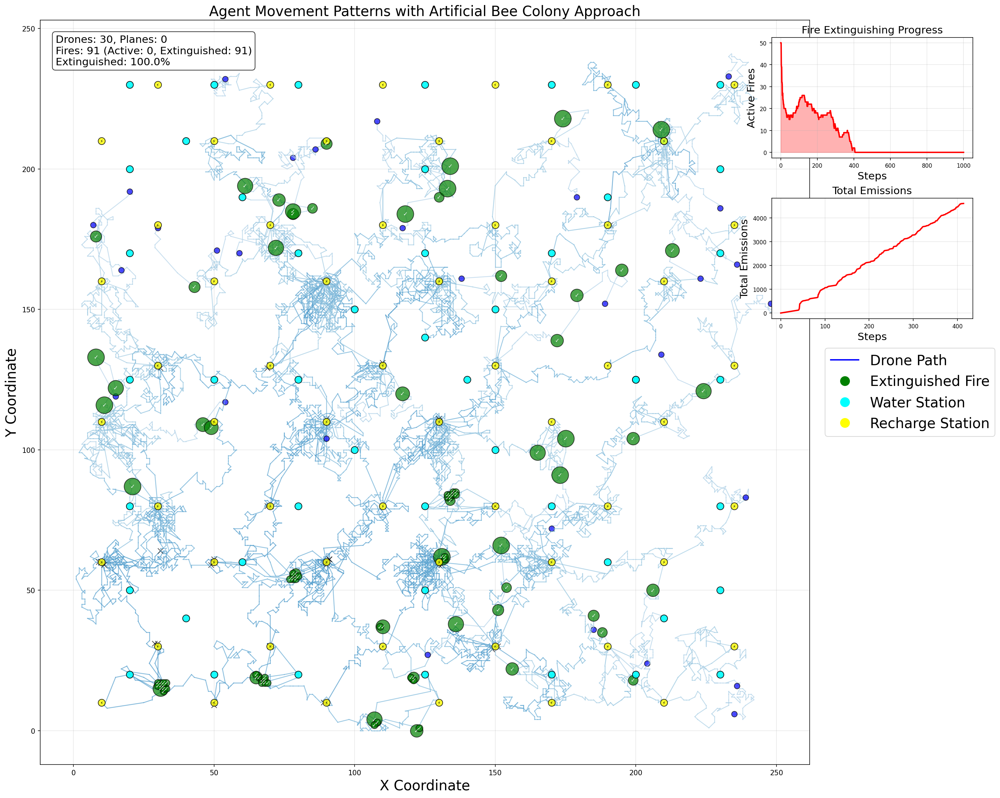

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [18]:
with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
    model = DroneModel(
        num_drones=30, 
        width=250, 
        height=250, 
        fires_n=50,
        drone_pathfinding_method="ABC"
    )

    # Run the model with a progress bar
    for i in tqdm(range(1000), desc="Running Simulation"):
        model.step()

# Collect data after silent simulation
abc_agent_data = model.datacollector.get_agent_vars_dataframe()
abc_model_data = model.datacollector.get_model_vars_dataframe()

visualize_agent_paths(abc_agent_data, abc_model_data, max_steps=1000, approach='Artificial Bee Colony')

### A_star path

/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/3992180277.py:31: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulation: 100%|██████████| 1000/1000 [00:00<00:00, 1319.76it/s]
/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/2478579757.py:269: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


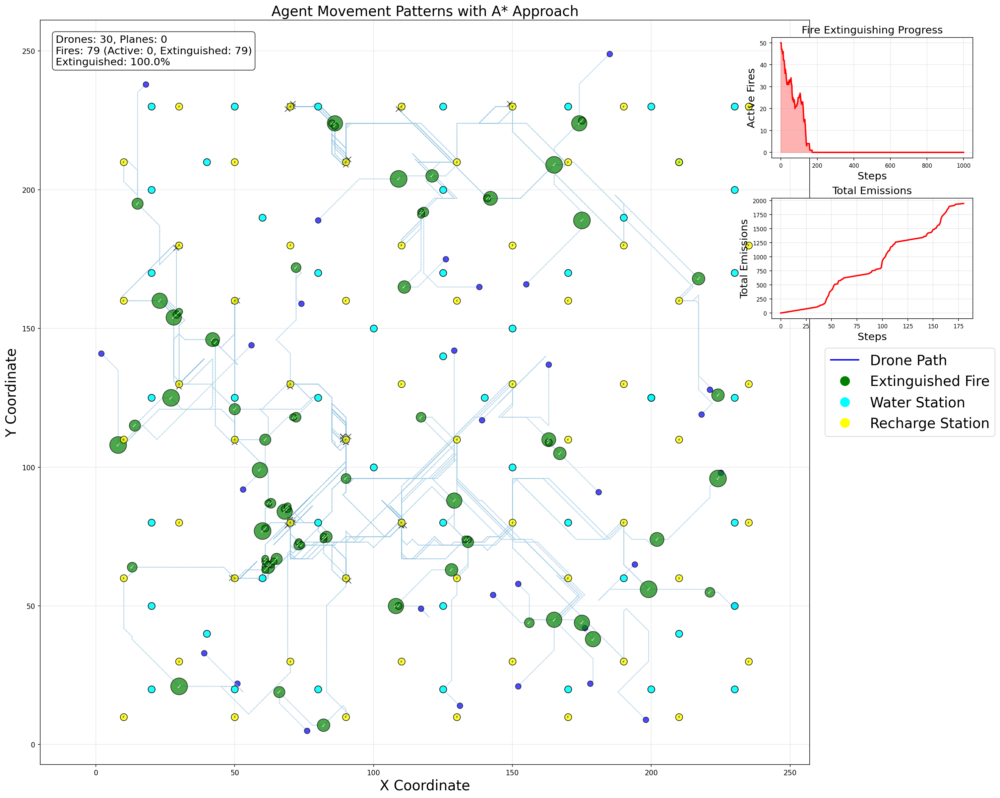

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [211]:

#* progress bar and supress print statements 
with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
    model = DroneModel(
        num_drones=30, 
        width=250, 
        height=250, 
        fires_n=50,
        drone_pathfinding_method="a_star"
    )

    for i in tqdm(range(1000), desc="Running Simulation"):
        model.step()

# Collect data after silent simulation
a_star_agent_data = model.datacollector.get_agent_vars_dataframe()
a_star_model_data = model.datacollector.get_model_vars_dataframe()

visualize_agent_paths(a_star_agent_data, a_star_model_data, max_steps=1000, approach='A*')

### Ant Colony Optimization Path

/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_1162/3992180277.py:31: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulation: 100%|██████████| 1000/1000 [01:46<00:00,  9.41it/s]
/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_1162/1625837193.py:266: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


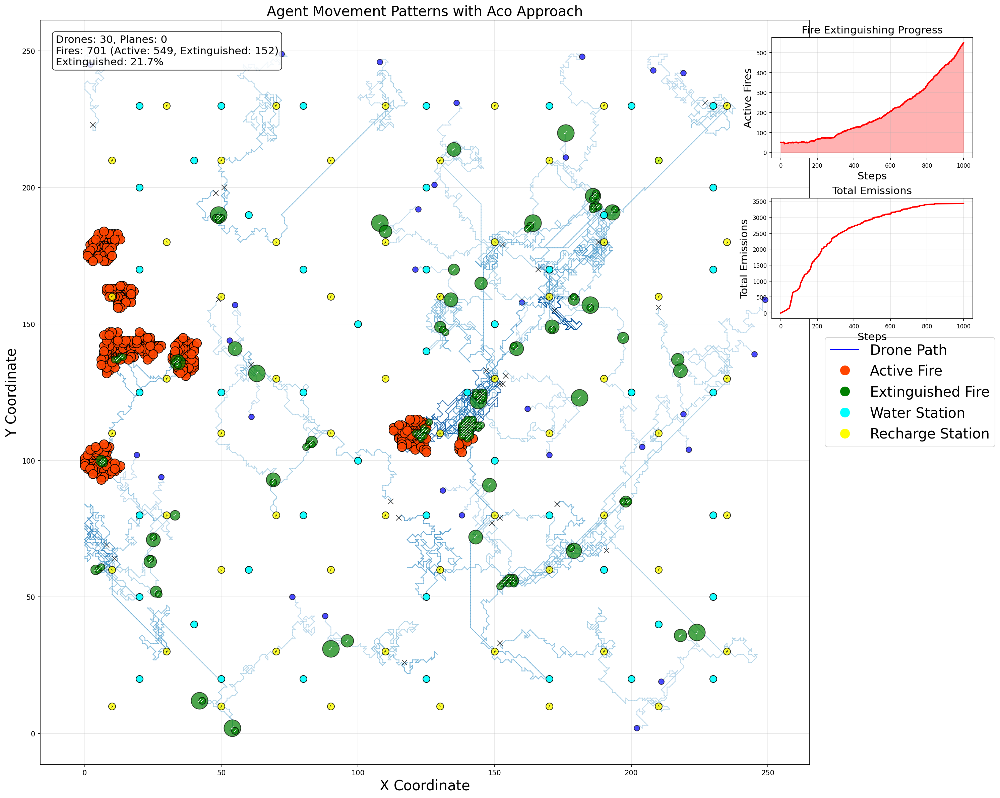

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [78]:

#* progress bar and supress print statements 
with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
    model = DroneModel(
        num_drones=30, 
        width=250, 
        height=250, 
        fires_n=50,
        drone_pathfinding_method="ACO" 
    )

    for i in tqdm(range(1000), desc="Running Simulation"):
        model.step()

# Collect data after silent simulation
aco_agent_data = model.datacollector.get_agent_vars_dataframe()
aco_model_data = model.datacollector.get_model_vars_dataframe()

visualize_agent_paths(aco_agent_data, aco_model_data, max_steps=1000, approach='ACO')

### firefighting plane path

/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_1162/3948914571.py:62: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulation: 100%|██████████| 1000/1000 [00:00<00:00, 1151.80it/s]
/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_1162/1625837193.py:266: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


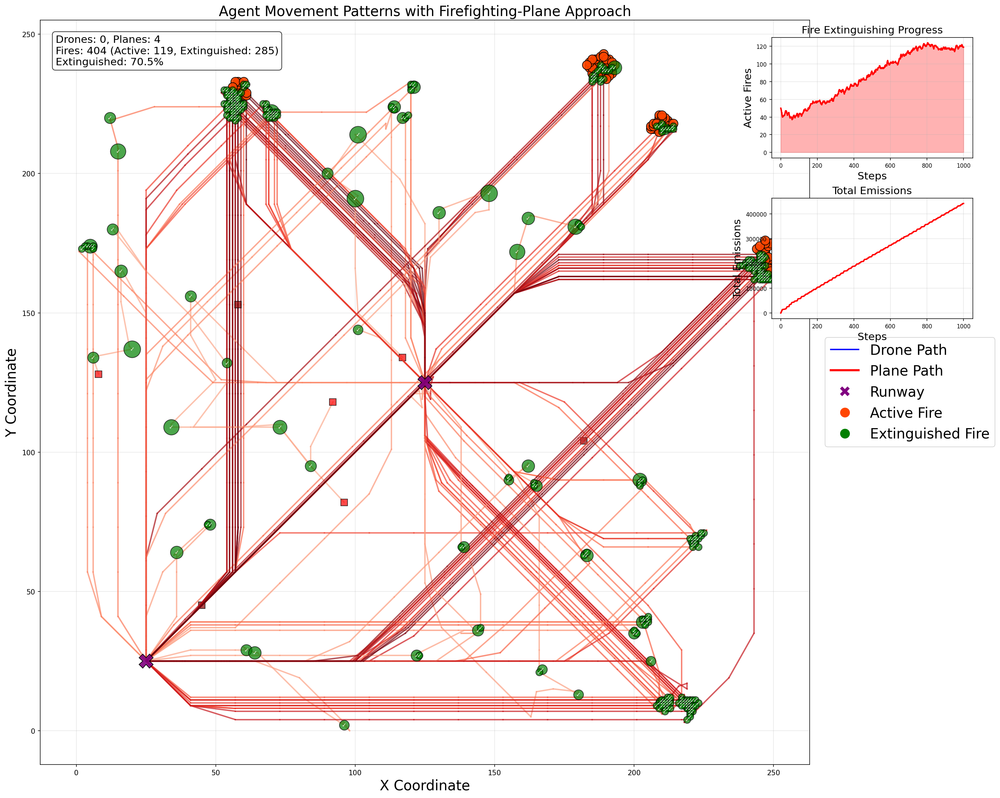

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [64]:

#* progress bar and supress print statements 
with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
    model = HybridFirefightingModel(
            num_planes=4, 
            runways_n=2,
            width=250, 
            height=250, 
            fires_n=50,
        )

    for i in tqdm(range(1000), desc="Running Simulation"):
        model.step()


plane_agent_data = model.datacollector.get_agent_vars_dataframe()
plane_model_data = model.datacollector.get_model_vars_dataframe()

visualize_agent_paths(plane_agent_data, plane_model_data, max_steps=1000, approach='firefighting-plane')

### Hybrid Approach Path

/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/3948914571.py:62: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulation: 100%|██████████| 1000/1000 [00:00<00:00, 1712.74it/s]
/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/2478579757.py:269: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


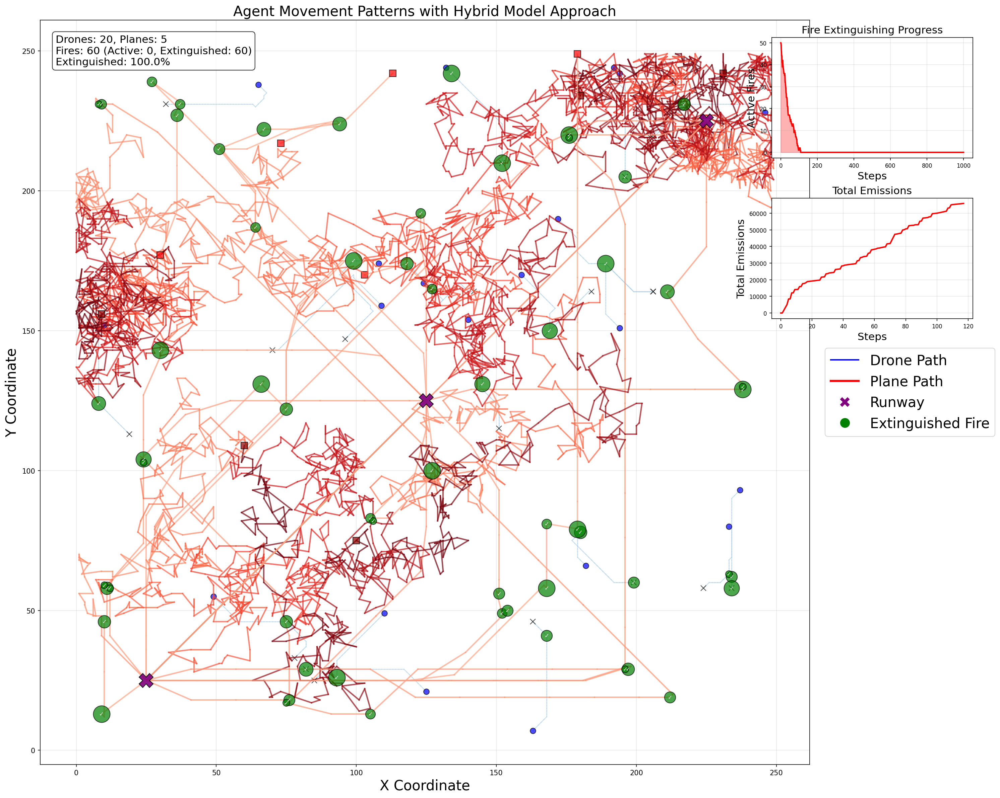

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:

#* progress bar and supress print statements 
with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
    model = HybridFirefightingModel(
            num_planes=5, 
            num_drones=20,
            width=250, 
            height=250, 
            fires_n=50,
        )


    for i in tqdm(range(1000), desc="Running Simulation"):
        model.step()


hybrid_agent_data = model.datacollector.get_agent_vars_dataframe()
hybrid_model_data = model.datacollector.get_model_vars_dataframe()

visualize_agent_paths(hybrid_agent_data, hybrid_model_data, max_steps=1000, approach='Hybrid Model')

## Machine Learning Clustering

In [65]:
agent_data = plane_agent_data

In [ ]:
class EnhancedFireRiskAnalyzer:
    def __init__(self, model, n_clusters=5):
        self.model = model
        self.n_clusters = n_clusters
        self.risk_map = None
        self.high_risk_areas = []
        self.features = None
        self.risk_history = []  #* risk evolution history
        self.fire_spread_predictions = {}  #* store predictions for fire spread
        
    def generate_features(self):
        #* generate features for fire risk analysis
        width, height = self.model.width, self.model.height
        features = []
        
        #* potential wind direction and speed (to test out)
        
        wind_direction = (1, 0)  #* east blowing wind
        wind_speed = 2  #* moderate wind speed equals  to 2 * 16kmh = 32kmh given speed of Drone
        
        #* generate features for each grid cell
        for x in range(width):
            for y in range(height):

                min_fire_dist = float('inf')
                min_water_dist = float('inf')
                active_fires_nearby = 0
                fire_intensity_factor = 0
                
                #* calculate distance to active fires
                for fire in self.model.active_fires:
                    base_dist = abs(x - fire.location[0]) + abs(y - fire.location[1])
                    
                    #* apply wind direction factor - areas downwind from fires are higher risk
                    wind_factor = self._calculate_wind_factor(
                        (x, y), fire.location, wind_direction, wind_speed
                    )
                    

                    adjusted_dist = base_dist / (wind_factor + 0.5)
                    
                    if adjusted_dist < min_fire_dist:
                        min_fire_dist = adjusted_dist
                    
                    #* count nearby active fires (in radius of 10)
                    if base_dist < 10:
                        active_fires_nearby += 1
                        fire_intensity_factor += fire.intensity / (base_dist + 1)
                
                #* calculate distance to water stations
                for station in self.model.water_stations:
                    dist = abs(x - station.location[0]) + abs(y - station.location[1])
                    min_water_dist = min(min_water_dist, dist)
                

                if min_fire_dist == float('inf'):
                    min_fire_dist = width + height  #
                if min_water_dist == float('inf'):
                    min_water_dist = width + height
                
                
                vegetation_density = self._simulate_vegetation_density(x, y, width, height)
                
                #* calculaate terrain factor (higher elevations might have different risks)(for future could be interesting)
                terrain_factor = self._simulate_terrain_factor(x, y, width, height)
                
                #* historical fire data (in a real system, this would come from historical records)
                historical_fire_probability = self._simulate_historical_fire_data(x, y, width, height)
                
                #* add more features as needed (could add more in the future)
                features.append([
                    x, y,                      
                    min_fire_dist,            
                    min_water_dist,           
                    active_fires_nearby,       
                    fire_intensity_factor,    
                    vegetation_density,        
                    terrain_factor,            
                    historical_fire_probability 
                ])
        
        self.features = np.array(features)
        return self.features
    
    def _calculate_wind_factor(self, point, fire_location, wind_direction, wind_speed):

        #* Calculate wind factor based on direction and speed
        direction_vector = (point[0] - fire_location[0], point[1] - fire_location[1])
        
        #* normalize direction vector
        magnitude = max(0.0001, np.sqrt(direction_vector[0]**2 + direction_vector[1]**2))
        direction_vector = (direction_vector[0]/magnitude, direction_vector[1]/magnitude)
        
        #* calculate dot product to find alignment with wind direction
        dot_product = direction_vector[0]*wind_direction[0] + direction_vector[1]*wind_direction[1]
        
        #* adjust the risk based on wind speed
        return max(0, dot_product * wind_speed * 0.3 + 1.0)
    
    def _simulate_vegetation_density(self, x, y, width, height):
        
        #* simulate vegetaion density - in real application this would come from satellite data or other sources
        center_x, center_y = width/2, height/2
        dist_from_center = np.sqrt((x - center_x)**2 + (y - center_y)**2)
        max_dist = np.sqrt((width/2)**2 + (height/2)**2)
        

        return 0.3 + 0.7 * (dist_from_center / max_dist)
    
    def _simulate_terrain_factor(self, x, y, width, height):
        
        #* terrain factor - implementation for future use
        center_x, center_y = width/2, height/2
        dist_from_center = np.sqrt((x - center_x)**2 + (y - center_y)**2)
        max_dist = np.sqrt((width/2)**2 + (height/2)**2)
        
        #* simulate elevation - higher elevations might have different risks
        elevation = 1.0 - (dist_from_center / max_dist)
        
        #* fire risk typically higher in valleys and ridges
        return 0.5 + 0.5 * np.sin(elevation * 3.14)
    
    def _simulate_historical_fire_data(self, x, y, width, height):

        #* simulate historical fire data - optimally from real records
        
        hotspots = [
            (width * 0.2, height * 0.2),
            (width * 0.8, height * 0.1),
            (width * 0.7, height * 0.7),
            (width * 0.3, height * 0.8)
        ]
        

        min_hotspot_dist = min(
            np.sqrt((x - hx)**2 + (y - hy)**2) for hx, hy in hotspots
        )
        

        max_possible_dist = np.sqrt(width**2 + height**2)
        return max(0, 1.0 - (min_hotspot_dist / (max_possible_dist * 0.3)))
    
    def cluster_risk_areas(self, use_dbscan=False):

        #* identifying high-risk areas using clustering 
        #* - here  KMeans or DBSCAN  is used for clustering

        if self.features is None:
            self.generate_features()
            
        #* feature scaling
        scaler = StandardScaler()
        
        #* not scaling coordinates
        locations = self.features[:, :2]
        risk_features = self.features[:, 2:]  
        scaled_features = scaler.fit_transform(risk_features)
        
        #* combine locations with scaled features
        clustering_features = np.hstack((locations, scaled_features))
        
        if use_dbscan:
            #* DBSCAN is better for finding arbitrary-shaped clusters
            dbscan = DBSCAN(eps=10, min_samples=5)
            cluster_labels = dbscan.fit_predict(clustering_features)
            
            #* handling noise points (labeled as -1)
            n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
            if n_clusters == 0:
                #* use KMeans if DBSCAN finds no clusters
                #? print("DBSCAN found no clusters, falling back to KMeans")
                kmeans = KMeans(n_clusters=self.n_clusters, random_state=42)
                cluster_labels = kmeans.fit_predict(clustering_features)
        else:
            #* KMeans with optimal parameters
            kmeans = KMeans(n_clusters=self.n_clusters, random_state=42, n_init=10)
            cluster_labels = kmeans.fit_predict(clustering_features)
        
        #* Calculate risk scores for each cluster
        risk_scores = []
        cluster_points = []
        
        for i in range(max(cluster_labels) + 1):
            points = self.features[cluster_labels == i]
            if len(points) == 0:
                continue
                
            cluster_points.append(points)
            
            #* multiple risk factors
            avg_fire_dist = np.mean(points[:, 2])
            avg_water_dist = np.mean(points[:, 3])
            avg_fires_nearby = np.mean(points[:, 4])
            avg_fire_intensity = np.mean(points[:, 5])
            avg_vegetation = np.mean(points[:, 6])
            avg_terrain = np.mean(points[:, 7])
            avg_historical = np.mean(points[:, 8])
            
            #* formula to calculate risk score
            fire_proximity_score = 50 / (avg_fire_dist + 1)
            water_distance_score = min(50, avg_water_dist) / 50
            fires_nearby_score = min(avg_fires_nearby * 10, 50) / 50
            intensity_score = min(avg_fire_intensity * 5, 50) / 50
            vegetation_score = avg_vegetation
            terrain_score = avg_terrain
            historical_score = avg_historical
            
            #* combine scores with weights
            risk_score = (
                fire_proximity_score * 0.25 +
                water_distance_score * 0.15 +
                fires_nearby_score * 0.20 +
                intensity_score * 0.15 +
                vegetation_score * 0.10 +
                terrain_score * 0.05 +
                historical_score * 0.10
            ) * 100  # Scale to 0-100
            
            risk_scores.append(risk_score)
        
        #* identify high-risk areas
        self.high_risk_areas = []
        sorted_indices = np.argsort(risk_scores)[::-1]  
        
        for idx in sorted_indices:
            points = cluster_points[idx]
            centroid = np.mean(points[:, :2], axis=0).astype(int)
            
            self.high_risk_areas.append({
                "location": (int(centroid[0]), int(centroid[1])),
                "risk_score": risk_scores[idx],
                "point_count": len(points),
                "avg_fire_dist": np.mean(points[:, 2]),
                "avg_water_dist": np.mean(points[:, 3]),
                "fires_nearby": np.mean(points[:, 4]),
                "vegetation": np.mean(points[:, 6]),
            })
        
        #* store risk map
        self.risk_map = np.zeros((self.model.width, self.model.height))
        for i, label in enumerate(cluster_labels):
            if label >= 0:  # Skip noise points
                x, y = int(self.features[i, 0]), int(self.features[i, 1])
                if 0 <= x < self.model.width and 0 <= y < self.model.height:
                    idx = np.where(sorted_indices == label)[0][0] if label in sorted_indices else -1
                    if idx >= 0:
                        self.risk_map[x, y] = risk_scores[idx]
        
        #* update risk history
        self.risk_history.append({
            "step": self.model.schedule.steps,
            "high_risk_areas": self.high_risk_areas.copy(),
            "avg_risk": np.mean([area["risk_score"] for area in self.high_risk_areas])
        })
        
        return self.high_risk_areas, self.risk_map
    
    def predict_fire_spread(self, time_horizon=10):
        
        #* predicting fire spread based on current active fires
        #! add environmental factors like wind, terrain, and vegetation for future implementation
        
        active_fires = [(fire.location, fire.intensity) for fire in self.model.active_fires if fire.active]
        
        #* check if there are active fires
        if not active_fires:
            return []
            
        #* For each fire, predict potential spread based on:
        #* - Current intensity
        #* - Wind direction/speed (if available)
        #* - Terrain and vegetation (if available)
        #* - Proximity to water sources ()
        predictions = {}
        wind_direction = (1, 0)  #* east blowing wind
        wind_speed = 2  #* moderate wind speed equals to 2 * 16kmh = 32kmh (see Drone implementation)
        
        for fire_location, intensity in active_fires:
            #* calculate potential spread radius based on intensity
            spread_radius = int(intensity * 1.5)
            potential_spread = []
            

            x, y = fire_location
            for dx in range(-spread_radius, spread_radius + 1):
                for dy in range(-spread_radius, spread_radius + 1):
                    nx, ny = x + dx, y + dy
                    

                    if not (0 <= nx < self.model.width and 0 <= ny < self.model.height) or (nx, ny) == fire_location:
                        continue
                    

                    has_fire = any(
                        agent.location == (nx, ny) and agent.active 
                        for agent in self.model.active_fires
                    )
                    
                    if has_fire:
                        continue
                    
                    
                    #* calculate distance from fire location
                    distance = np.sqrt(dx**2 + dy**2)
                    if distance > spread_radius:
                        continue
                    

                    base_prob = max(0, 1.0 - (distance / spread_radius))
                    
                    #* calculate wind factor
                    wind_factor = self._calculate_wind_factor(
                        (nx, ny), fire_location, wind_direction, wind_speed
                    )
                    
                    #* calculate vegetation density
                    veg_density = self._simulate_vegetation_density(nx, ny, self.model.width, self.model.height)
                    
                    #* final spread probability
                    spread_prob = base_prob * intensity/10 * wind_factor * veg_density
                    
                    #* if probability is significant, add to potential spread locations
                    if spread_prob > 0.2:
                        potential_spread.append({
                            "location": (nx, ny),
                            "probability": spread_prob,
                            "time_estimate": int(distance) + 1  #* steps until spread
                        })
            
            #* sort by probability and keep top 10 predictions
            potential_spread.sort(key=lambda x: x["probability"], reverse=True)
            predictions[fire_location] = potential_spread[:10]  #* top 10 predictions
        
        self.fire_spread_predictions = predictions
        return predictions
    
    def visualize_risk_map(self,
                        show_spread_predictions=True,
                        show_water_stations=True,
                        show_recharge_stations=True,
                        show_drones=True,
                        show_planes=False,
                        show_fires=True,
                        show_extinguished_fires=True
                        ):

        import matplotlib.pyplot as plt
        
        if self.risk_map is None:
            self.cluster_risk_areas()
        
        plt.figure(figsize=(14, 10))
        
        #* plot heat map
        plt.imshow(self.risk_map.T, cmap='YlOrRd', interpolation='nearest')
        plt.colorbar(label='Fire Risk Score')
        
        #* mark high-risk areas with circles
        for i, area in enumerate(self.high_risk_areas[:5]):  #  top 5 risk areas
            x, y = area['location']
            risk = area['risk_score']
            
            #* circle size based on risk score
            circle_size = 20 + (risk / 10)
            
            #* plot circle with color based on risk score
            circle = plt.Circle((x, y), circle_size, color=f'C{i}', 
                             fill=False, linewidth=3, alpha=0.8)
            plt.gcf().gca().add_artist(circle)
            
            #* plot outer circle with dashed line
            outer_circle = plt.Circle((x, y), circle_size+5, color=f'C{i}', 
                                     fill=False, linewidth=1.5, 
                                     linestyle='--', alpha=0.6)
            plt.gcf().gca().add_artist(outer_circle)
            
            #* add risk score label
            plt.annotate(f"Risk: {risk:.1f}", 
                        xy=(x, y), 
                        fontsize=12, 
                        color='white',
                        weight='bold',
                        ha='center', 
                        va='center',
                        bbox=dict(boxstyle="round,pad=0.3", 
                                 fc=f'C{i}', 
                                 alpha=0.7))
        
        #* plot active fires        
        if show_fires == True:

            for fire in self.model.active_fires:
                if fire.active:
                    x, y = fire.location
                    #* size based on intensity
                    marker_size = 100 + fire.intensity*30

                    plt.scatter(x, y, c='red', marker='*', s=marker_size, 
                            edgecolors='orangered', linewidth=1.5, alpha=0.9, zorder=10)
                    
                    """
                    #* add intensity label
                    plt.text(x, y+5, f"Int: {fire.intensity:.1f}", 
                            fontsize=9, color='white', ha='center', va='center',
                            bbox=dict(boxstyle="round,pad=0.2", fc='firebrick', alpha=0.7))
                    """
    
                    for size in [marker_size*1.2, marker_size*1.5]:
                        plt.scatter(x, y, c='orange', marker='*', s=size, 
                                alpha=0.15, zorder=9)
        
        #* plot spread predictions if requested
        if show_spread_predictions and hasattr(self, 'fire_spread_predictions'):

            if not self.fire_spread_predictions:
                self.predict_fire_spread()
                
            for fire_loc, predictions in self.fire_spread_predictions.items():
                for pred in predictions:
                    x, y = pred["location"]
                    prob = pred["probability"]
                    time_est = pred["time_estimate"]
                    
                    size = 30 + 100 * prob
                    alpha = 0.3 + 0.6 * prob
                    
                    plt.scatter(x, y, c='orange', marker='o', s=size, 
                              alpha=alpha, edgecolors='red', linewidths=1)
                    
                    fx, fy = fire_loc
                    plt.arrow(fx, fy, (x-fx)*0.7, (y-fy)*0.7, color='red', 
                             alpha=0.4, width=0.5, head_width=3, length_includes_head=True)
        
        #* plot water stations
        if show_water_stations == True:
            for station in self.model.water_stations:
                x, y = station.location
                plt.scatter(x, y, c='blue', marker='o', s=80, 
                        edgecolors='black', label='Water Station')
        
        #* plot recharge stations
        if show_recharge_stations == True:
            for station in self.model.recharge_stations:
                x, y = station.location
                plt.scatter(x, y, c='yellow', marker='o', s=100, 
                        edgecolors='black', label='Recharge Station')
                plt.text(x, y+3, "⚡", fontsize=10, ha='center', color='black')
            
        #* plot drones and planes
        if show_drones == True:
            for agent in self.model.schedule.agents:
                if isinstance(agent, DroneAgent):
                    x, y = agent.location
                    plt.scatter(x, y, c='black', marker='o', s=50, 
                            edgecolors='black', label='Drone')
        if show_planes == True:
            for agent in self.model.schedule.agents:
                if isinstance(agent, FirefightingPlane):
                    x, y = agent.location
                    plt.scatter(x, y, c='purple', marker='X', s=80, 
                            edgecolors='black', label='Plane')
        
        #* add extinguished fires
        if show_extinguished_fires == True:
            for fire in self.model.extinguished_fires:
                x, y = fire.location
                plt.scatter(x, y, c='green', marker='x', s=100, label='Extinguished Fire')
        

        #* legen initiation
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        plt.legend(by_label.values(), by_label.keys(), loc='upper right')
        
        plt.title('Fire Risk Analysis - High Risk Areas', fontsize=16)
        plt.xlabel('X Coordinate', fontsize=12)
        plt.ylabel('Y Coordinate', fontsize=12)
        plt.grid(False)
        
        plt.tight_layout()
        plt.savefig('plots/enhanced_fire_risk_analysis.png', dpi=300, bbox_inches='tight')
        plt.show()
        
        return plt.gcf()
    



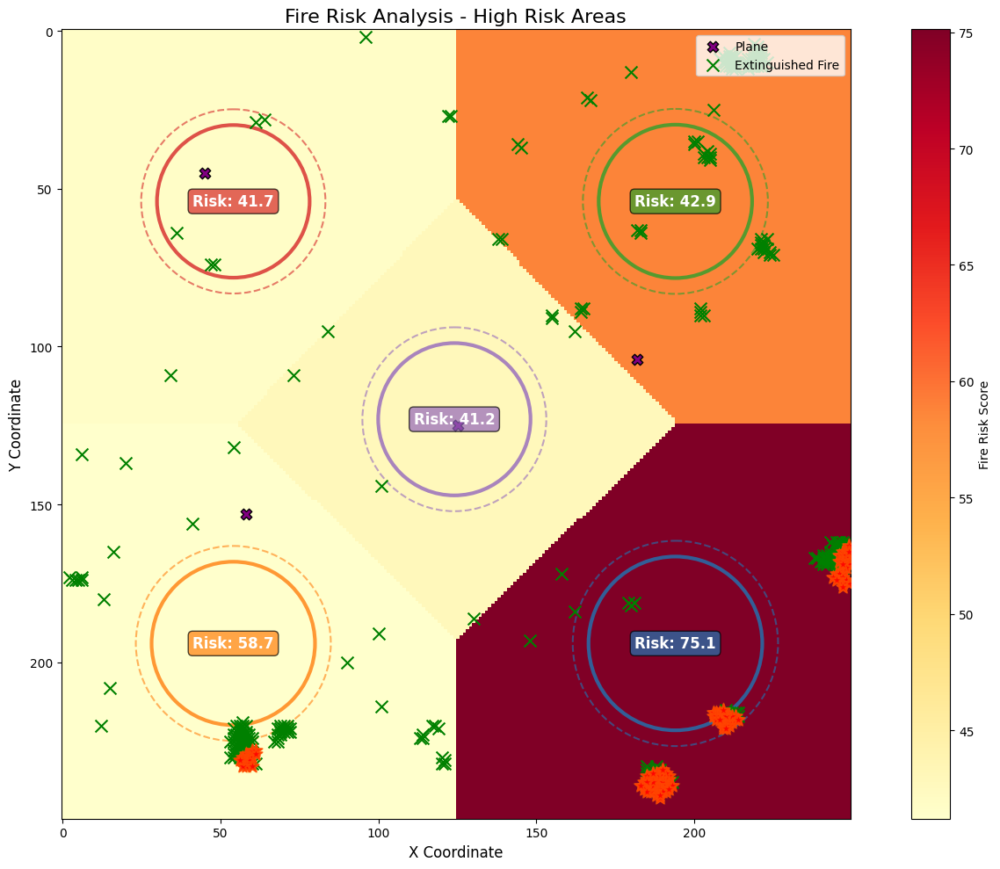

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [77]:
#* using the enhanced fire risk analyzer
risk_analyzer = EnhancedFireRiskAnalyzer(model, n_clusters=5)

#* calculate high risk areas
high_risk_areas, risk_map = risk_analyzer.cluster_risk_areas()

#* predict fire spread for the next "__" steps
spread_predictions = risk_analyzer.predict_fire_spread(time_horizon=100)


risk_analyzer.visualize_risk_map(
    show_spread_predictions=True,
    show_water_stations=False,
    show_recharge_stations=False,
    show_drones=False,
    show_planes=True,
    show_fires=True,
    show_extinguished_fires=True
    )   

#*  notify drones about high-risk areas - implementation still in progress
#! model.notify_high_risk_areas(high_risk_areas)

## tracking per drone energy, water, path 

In [19]:
agent_data = abc_agent_data

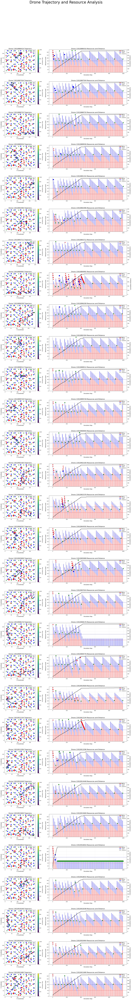

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MaxNLocator

# Extract drone data
drone_data = agent_data[agent_data['Type'] == 'DroneAgent']
drone_ids = drone_data.index.get_level_values('AgentID').unique()
max_step = agent_data.index.get_level_values('Step').max()
num_drones = len(drone_ids)

# Find column names - check for both capitalized and lowercase
energy_col = None
water_col = None
location_x_col = None
location_y_col = None

for col in drone_data.columns:
    if col.lower() == 'energy':
        energy_col = col
    elif col.lower() == 'water':
        water_col = col
    elif col.lower() == 'location_x':
        location_x_col = col
    elif col.lower() == 'location_y':
        location_y_col = col

# Define thresholds
energy_threshold = 40  # Adjust if different in your model
water_threshold = 40   # Adjust if different in your model

# Get fire, water station, and recharge station locations
fire_locations = []
if 'FireArea' in agent_data['Type'].values:
    fire_data = agent_data[agent_data['Type'] == 'FireArea']
    for fire_id in fire_data.index.get_level_values('AgentID').unique():
        fire_df = fire_data.xs(fire_id, level='AgentID')
        if location_x_col in fire_df.columns and location_y_col in fire_df.columns:
            fire_loc = (fire_df[location_x_col].iloc[0], fire_df[location_y_col].iloc[0])
            fire_locations.append(fire_loc)

water_locations = []
if 'WaterStation' in agent_data['Type'].values:
    water_station_data = agent_data[agent_data['Type'] == 'WaterStation']
    for station_id in water_station_data.index.get_level_values('AgentID').unique():
        water_df = water_station_data.xs(station_id, level='AgentID')
        if location_x_col in water_df.columns and location_y_col in water_df.columns:
            water_loc = (water_df[location_x_col].iloc[0], water_df[location_y_col].iloc[0])
            water_locations.append(water_loc)

recharge_locations = []
if 'RechargeStation' in agent_data['Type'].values:
    recharge_station_data = agent_data[agent_data['Type'] == 'RechargeStation']
    for station_id in recharge_station_data.index.get_level_values('AgentID').unique():
        recharge_df = recharge_station_data.xs(station_id, level='AgentID')
        if location_x_col in recharge_df.columns and location_y_col in recharge_df.columns:
            recharge_loc = (recharge_df[location_x_col].iloc[0], recharge_df[location_y_col].iloc[0])
            recharge_locations.append(recharge_loc)


# Create a second figure for combined trajectory and resource analysis
fig = plt.figure(figsize=(20, 5*num_drones), dpi=100)

for i, drone_id in enumerate(drone_ids):
    # Create a grid with 2 columns - trajectory and resources
    gs = gridspec.GridSpec(num_drones, 2, width_ratios=[1, 2])
    
    # Extract data for this specific drone
    drone_path = drone_data.xs(drone_id, level='AgentID')
    steps = drone_path.index.get_level_values('Step')
    
    if energy_col and water_col and location_x_col and location_y_col:
        energy = drone_path[energy_col].values
        water = drone_path[water_col].values
        x = drone_path[location_x_col].values
        y = drone_path[location_y_col].values
        
        # 1. Trajectory plot
        ax_traj = plt.subplot(gs[i, 0])
        
        # Plot trajectory with color gradient based on step
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        
        # Create a colormap that transitions from green to red
        cmap = plt.cm.viridis
        norm = plt.Normalize(0, len(steps))
        colors = cmap(norm(range(len(steps))))
        
        # Plot the path segments
        for j in range(len(segments)):
            seg = segments[j]
            ax_traj.plot([seg[0, 0], seg[1, 0]], [seg[0, 1], seg[1, 1]], 
                         color=colors[j], linewidth=2.5, alpha=0.8)
        
        # Mark start and end positions
        ax_traj.plot(x[0], y[0], 'go', markersize=10, label='Start')
        ax_traj.plot(x[-1], y[-1], 'mo', markersize=10, label='End')
        
        # Plot fire, water, and recharge stations
        for loc in fire_locations:
            ax_traj.plot(loc[0], loc[1], 'r*', markersize=15, alpha=0.7)
            #ax_traj.text(loc[0]+2, loc[1], 'Fire', fontsize=10, color='red')
        
        for loc in water_locations:
            ax_traj.plot(loc[0], loc[1], 'bs', markersize=10, alpha=0.7)
            #ax_traj.text(loc[0]+2, loc[1], 'Water', fontsize=10, color='blue')
        
        for loc in recharge_locations:
            ax_traj.plot(loc[0], loc[1], 'g^', markersize=10, alpha=0.7)
            #ax_traj.text(loc[0]+2, loc[1], 'Recharge', fontsize=10, color='green')
        
        # Add colorbar to show time progression
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax_traj)
        cbar.set_label('Simulation Step', fontsize=10)
        
        ax_traj.set_title(f'Drone {drone_id} Trajectory', fontsize=16)
        ax_traj.set_xlabel('X Coordinate', fontsize=12)
        ax_traj.set_ylabel('Y Coordinate', fontsize=12)
        ax_traj.grid(True, alpha=0.3)
        ax_traj.legend(loc='upper right', fontsize=10)
        
        # 2. Resource timeline with distance markers
        ax_res = plt.subplot(gs[i, 1])
        
        # Calculate cumulative distance
        distances = [0]
        total_dist = 0
        for j in range(1, len(x)):
            dist = np.sqrt((x[j] - x[j-1])**2 + (y[j] - y[j-1])**2)
            total_dist += dist
            distances.append(total_dist)
        
        # Plot stacked bar chart with energy and water
        width = 0.35
        p1 = ax_res.bar(steps, energy, width, color='red', alpha=0.6, label='Energy')
        p2 = ax_res.bar(steps, water, width, bottom=energy, color='blue', alpha=0.6, label='Water')
        
        # Add threshold lines
        ax_res.axhline(y=energy_threshold, color='red', linestyle='--', alpha=0.7)
        ax_res.axhline(y=energy_threshold + water_threshold, color='blue', linestyle='--', alpha=0.7)
        
        # Add distance line on secondary axis
        ax_dist = ax_res.twinx()
        dist_line = ax_dist.plot(steps, distances, 'k-', linewidth=2, label='Distance')
        
        # Labels and title
        ax_res.set_title(f'Drone {drone_id} Resources and Distance', fontsize=16)
        ax_res.set_xlabel('Simulation Step', fontsize=12)
        ax_res.set_ylabel('Resource Level', fontsize=12)
        ax_dist.set_ylabel('Cumulative Distance', fontsize=12, color='black')
        
        # Configure axes
        ax_res.grid(True, alpha=0.3)
        ax_res.set_ylim(bottom=0)
        ax_dist.tick_params(axis='y', labelcolor='black')
        
        #* legend settings
        h1, l1 = ax_res.get_legend_handles_labels()
        h2, l2 = ax_dist.get_legend_handles_labels()
        ax_res.legend(h1 + h2, l1 + l2, loc='upper right', fontsize=10)
        
        
        #* mark positions of fire, water, and recharge stations
        for j, step in enumerate(steps):
            pos = (x[j], y[j])
            y_pos = energy[j] + water[j] if j < len(energy) and j < len(water) else 0
            
            if pos in recharge_locations:
                ax_res.plot(step, y_pos + 5, 'g^', markersize=10)
            elif pos in water_locations:
                ax_res.plot(step, y_pos + 5, 'bs', markersize=10)
            elif pos in fire_locations:
                ax_res.plot(step, y_pos + 5, 'r*', markersize=10)

#* show the plot
plt.tight_layout()
plt.subplots_adjust(top=0.95, hspace=0.4)

plt.suptitle('Drone Trajectory and Resource Analysis', fontsize=40, y=0.999)
plt.show()

# *run simulations multiple times and store in data frames*

In [222]:

#! -------- intialize time_df and steps  --------

time_df = pd.DataFrame(columns=['Approach', 'Time (s)', 'iteration'])

#* libararies for the analysis
from tqdm import tqdm
import sys
import time
import os
from contextlib import redirect_stdout
#* numer of steps the simulations will run
steps = 1000

## ABC analysis

In [223]:
for _ in tqdm(range(steps), desc="Running Simulations"): #supress print output 
    with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
        
        start_time = time.time()
        
        model = DroneModel(
            num_drones=30, 
            width=250, 
            height=250, 
            fires_n=50,
            drone_pathfinding_method='abc'
        )
        
        for i in range(1000):
            model.step()
        
        end_time = time.time()
        iteration_duration = end_time - start_time
        time_df = pd.concat([time_df, pd.DataFrame({
            'Approach': ['ABC'],
            'Time (s)': [iteration_duration],
            'iteration': [_]
        })], ignore_index=True)
        

    # Collect data after silent simulation
    #agent_data = model.datacollector.get_agent_vars_dataframe()
    model_data = model.datacollector.get_model_vars_dataframe()

    # Save data to disk
    #agent_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/ABC/agent_data_iter{_}.csv")
    model_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/ABC/model_data_iter{_}.csv")


Running Simulations:   0%|          | 0/1000 [00:00<?, ?it/s]

/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/3992180277.py:31: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulations: 100%|██████████| 1000/1000 [14:45<00:00,  1.13it/s]


## A* Analysis

In [224]:
for _ in tqdm(range(steps), desc="Running Simulations"):
    with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
        start_time = time.time()    

        model = DroneModel(
            num_drones=30, 
            width=250, 
            height=250, 
            fires_n=50,
            drone_pathfinding_method=approach
        )

        for i in range(1000):
            model.step()
            
        end_time = time.time()
        iteration_duration = end_time - start_time
        time_df = pd.concat([time_df, pd.DataFrame({
            'Approach': ['a_star'],
            'Time (s)': [iteration_duration],
            'iteration': [_]
        })], ignore_index=True)
    
    #* data collection
    #agent_data = model.datacollector.get_agent_vars_dataframe()
    model_data = model.datacollector.get_model_vars_dataframe()

    # Save data to disk
    #agent_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/a_star/agent_data_iter{_}.csv")
    model_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/a_star/model_data_iter{_}.csv")


Running Simulations:   0%|          | 0/1000 [00:00<?, ?it/s]/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/3992180277.py:31: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulations: 100%|██████████| 1000/1000 [14:51<00:00,  1.12it/s]


## ACO analysis

In [225]:
for _ in tqdm(range(steps), desc="Running Simulations"):
    with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
        
        start_time = time.time()
        
        model = DroneModel(
            num_drones=30, 
            width=250, 
            height=250, 
            fires_n=50,
            drone_pathfinding_method='aco'
        )
        

        for i in range(1000):
            model.step()
        
        end_time = time.time()
        iteration_duration = end_time - start_time
        time_df = pd.concat([time_df, pd.DataFrame({
            'Approach': ['aco'],
            'Time (s)': [iteration_duration],
            'iteration': [_]
        })], ignore_index=True)
     
        
    #agent_data = model.datacollector.get_agent_vars_dataframe()
    model_data = model.datacollector.get_model_vars_dataframe()

    #agent_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/ACO/agent_data_iter{_}.csv")
    model_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/ACO/model_data_iter{_}.csv")


Running Simulations:   0%|          | 0/1000 [00:00<?, ?it/s]/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/3992180277.py:31: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulations: 100%|██████████| 1000/1000 [14:44<00:00,  1.13it/s]


## Plane analysis

In [232]:
for _ in tqdm(range(steps), desc="Running Simulations"):
    with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
        
        start_time = time.time()
        
        model = HybridFirefightingModel(
            num_planes=4, 
            width=250, 
            height=250, 
            fires_n=50,
        )
        

        for i in range(1000):
            model.step()
            
        end_time = time.time()
        iteration_duration = end_time - start_time
        time_df = pd.concat([time_df, pd.DataFrame({
            'Approach': ['plane'],
            'Time (s)': [iteration_duration],
            'iteration': [_]
        })], ignore_index=True)
    


    #agent_data = model.datacollector.get_agent_vars_dataframe()
    model_data = model.datacollector.get_model_vars_dataframe()

    #agent_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/Plane/agent_data_iter{_}.csv")
    model_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/Plane/model_data_iter{_}.csv")

Running Simulations:   0%|          | 0/1000 [00:00<?, ?it/s]/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/3948914571.py:62: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulations: 100%|██████████| 1000/1000 [08:19<00:00,  2.00it/s]


## Hybrid analysis

In [233]:
approach = 'hybrid'
for _ in tqdm(range(steps), desc="Running Simulations"):
    with open(os.devnull, 'w') as fnull, redirect_stdout(fnull):
        
        start_time = time.time()
        
        model = HybridFirefightingModel(
            num_planes=5, 
            num_drones=30,
            width=250, 
            height=250, 
            fires_n=50,
        )
        for i in range(1000):
            model.step()

        end_time = time.time()
        iteration_duration = end_time - start_time
        time_df = pd.concat([time_df, pd.DataFrame({
            'Approach': ['hybrid'],
            'Time (s)': [iteration_duration],
            'iteration': [_]
        })], ignore_index=True)
        
    #agent_data = model.datacollector.get_agent_vars_dataframe()
    model_data = model.datacollector.get_model_vars_dataframe()

    # Save data to disk
    #agent_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/Hybrid/agent_data_iter{_}.csv")
    model_data.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/Hybrid/model_data_iter{_}.csv")


Running Simulations:   0%|          | 0/1000 [00:00<?, ?it/s]/var/folders/pt/w218tf6j5kz72yf4j8vy4g0r0000gn/T/ipykernel_74358/3948914571.py:62: UserWarning: You are trying to set model.agents. In a next release, this attribute is used by MESA itself so you cannot use it directly anymore.Please adjust your code to use a different attribute name for custom agent storage
  self.agents = []
Running Simulations: 100%|██████████| 1000/1000 [08:35<00:00,  1.94it/s]


In [234]:
time_df.to_csv(f"/Users/kaispeidel/Downloads/thesis-1/simulation/comparativeAnalysis/time_df.csv")